# Trajectory KD vs WT

In [1]:
here::i_am("revisions/04_TEomes_interaction/01_AllantoisTrajectory_KDvWT.ipynb")

source(here::here("settings.R"))
source(here::here("utils.R"))

suppressPackageStartupMessages(library(scran))
suppressPackageStartupMessages(library(scater))
suppressPackageStartupMessages(library(Seurat))
suppressPackageStartupMessages(library(dplyr))
suppressPackageStartupMessages(library(edgeR))
suppressPackageStartupMessages(library(destiny))
suppressPackageStartupMessages(library(tradeSeq))
suppressPackageStartupMessages(library(slingshot))
suppressPackageStartupMessages(library(ArchR))
suppressPackageStartupMessages(library(BiocParallel))

suppressPackageStartupMessages(library(circlize))
suppressPackageStartupMessages(library(scales))
suppressPackageStartupMessages(library(ComplexHeatmap))

BPPARAM <- BiocParallel::bpparam()
BPPARAM$workers = 24

# Multi core using future - built in to seurat
plan("multicore", workers = 16)
options(future.globals.maxSize = 50 * 1024 ^ 3) # for 50 Gb RAM
set.seed(42)

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/code

Warning message:
“package ‘rtracklayer’ was built under R version 4.2.3”

                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | 

In [2]:
args = list()

# Metadata
args$metadata = file.path(io$basedir, 'results/rna_atac/clustering/metadata_celltype_annotated_v2.txt.gz')

# RNA_sce
args$rna_sce = file.path(io$basedir, 'results/rna_atac/trajectory/v3/rna_sce.rds')

args$logFC_thr = 0.25
args$FDR_thr = 0.05

# outdir
args$outdir = file.path(io$basedir, 'results/revisions/04_TEomes_interaction/')
dir.create(args$outdir, recursive=TRUE, showWarnings =FALSE)

# Only continue with Trajectory 2 cell types, and assign all cells to that lineage

## Pre-processing

In [13]:
# Load meta
meta = fread(args$metadata)[day %in% c('D3.5', 'D4', 'D4.5', 'D5')] %>% 
    .[celltype_v2 %in% c('Primitive_Streak', 'Early_Mes_EOi','Posterior_Mes', 'Allantois_Precursor')] # Focus on right cell types

In [14]:
# load sce
rna.sce <- load_SingleCellExperiment(args$rna_sce, normalise = F, cells = meta$cell)

In [15]:
# Assign cells to lineage, doing this now to make sure it's consistent
# Notice, assignCells is not fixed in which cells are assigned which lineage, even after setting a seed!
set.seed(42)
assign_lineages = tradeSeq:::.assignCells(assays(rna.sce$slingshot)$weights)
#colnames(assign_lineages) = c('Trajectory1', 'Trajectory2')
pseudotime = slingPseudotime(rna.sce$slingshot, na=T)

Traj_assignment = as.data.table(assign_lineages, keep.rownames=T) %>%
    setnames(c('cell', paste0('Trajectory', 1:(length(.)-1))))

Traj1 = as.data.table(pseudotime[,1], keep.rownames=T) %>% 
    .[V1 %in% Traj_assignment[Trajectory1 == 1, cell]] #%>% 
   # .[V2>5 & V2<10]

Traj2 = as.data.table(pseudotime[,2], keep.rownames=T) %>% 
    .[V1 %in% Traj_assignment[Trajectory2 == 1, cell]] #%>% 
    #.[V2>5 & V2<10]

In [16]:
# Combine & add which trajectory
Traj_full = rbind(Traj1[,Traj:='Trajectory1'], Traj2[,Traj:='Trajectory2']) %>%
    setnames(c('cell', 'pseudotime', 'Traj'))

In [17]:
# Add trajectory info to metadata
meta2 = rbind(meta[cell %in% Traj_assignment[Trajectory1==1, cell]] %>% 
                  .[, trajectory := 'Traj1'] %>%
                  .[, pseudotime := colData(rna.sce[,cell])$slingPseudotime_1],
              meta[cell %in% Traj_assignment[Trajectory2==1, cell]] %>%
                  .[, trajectory := 'Traj2'] %>%
                  .[, pseudotime := colData(rna.sce[,cell])$slingPseudotime_2])

# Keep only Allantois trajectory 
meta2 = meta2[trajectory == 'Traj2']

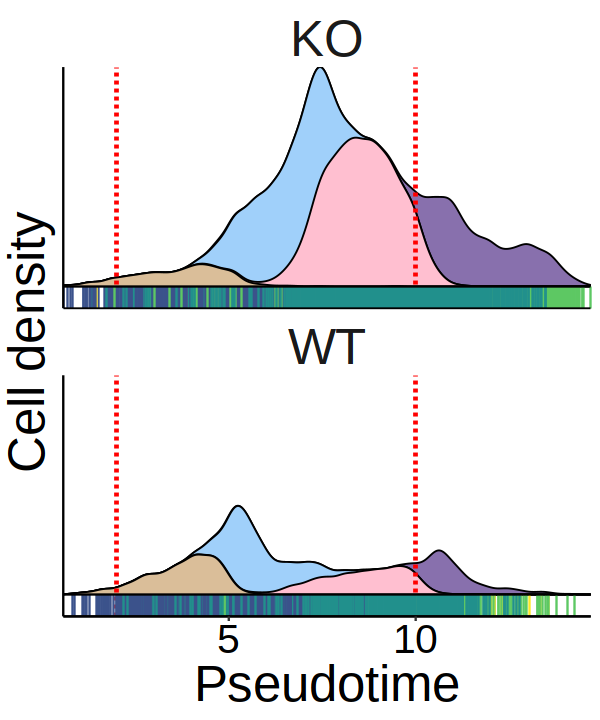

In [118]:
# facet_labels = c()
p1 = ggplot(meta2, aes(pseudotime, fill=celltype_v2)) + 
    # geom_histogram(binwidth=0.1, position='stack') + 
    geom_density(aes(y = after_stat(density * n/10)), position = 'stack', color = 'black', linewidth = 0.4, bw = 0.2) + 
    scale_colour_manual(values = opts$days.colors, name='day') + 
    scale_fill_manual(values = opts$celltype_v2.colors, name='Celltype') +
    scale_x_continuous(expand=c(0,0)) + 
    scale_y_continuous(expand=c(0,0)) + 
    geom_vline(xintercept = c(2, 10), color='red', linetype = 'dashed', linewidth = 1) + 
    xlab('Pseudotime') + ylab('Cell density') + 
    facet_wrap(~genotype, ncol = 1, 
               scales='fixed', 
               labeller = labeller(trajectory = c('Traj1' = 'Trajectory 1', 'Traj2' = 'Trajectory 2'))) + 
    theme_classic() + 
    theme(text = element_text(size=30),
          axis.text = element_text(color='black'),
          axis.text.y = element_blank(),
          axis.ticks.y = element_blank(),
          strip.background = element_blank(),
          strip.text = element_text(size=30),
          legend.position='none')
p1_values = ggplot_build(p1)
p1 = p1 +    
    geom_segment(aes(x = pseudotime, xend = pseudotime, y = 0, yend = -max(p1_values$data[[1]]$ymax)/10, col=day)) + 
    geom_hline(yintercept=c(0,-max(p1_values$data[[1]]$ymax)/10), color='black')

options(repr.plot.width = 5, repr.plot.height=6)
p1

In [119]:
rna.sce

class: SingleCellExperiment 
dim: 32285 12472 
metadata(0):
assays(1): counts
rownames(32285): Xkr4 Gm1992 ... AC234645.1 AC149090.1
rowData names(0):
colnames(12472): 2_Eo_DEG_G9_day3_5_VC#AAACAGCCATGGAGGC-1
  2_Eo_DEG_G9_day3_5_VC#AAACATGCATTAGGCC-1 ...
  rv_eo_deg_day4_dtag#TTTGTGTTCATTTGTC-1
  rv_eo_deg_day4_dtag#TTTGTTGGTACTTAGG-1
colData names(29): barcode sample ... slingPseudotime_1
  slingPseudotime_2
reducedDimNames(4): pca mofa mofa_umap DiffusionMap
mainExpName: RNA
altExpNames(0):

In [120]:
rna.sce = logNormCounts(rna.sce)

In [121]:
# Keep only cells within pseudotime window for analysis
pseudo_min = 2 # Previously had 4 -> 10
pseudo_max = 10

within_pseudotime_cells = meta2[pseudotime > pseudo_min & pseudotime <= pseudo_max, cell]

In [122]:
length(within_pseudotime_cells)

[1] 7176

## RNA Analysis

In [123]:
## Filter genes
#By minimum expression cdr
expression = data.table(gene = rownames(rna.sce),
                      KO_cdr = rowMeans(logcounts(rna.sce[,meta[cell %in% within_pseudotime_cells & genotype == 'KO', cell]])>0),
                       WT_cdr = rowMeans(logcounts(rna.sce[,meta[cell %in% within_pseudotime_cells & genotype == 'WT', cell]])>0))
genes_test = expression[KO_cdr > 0.15 | WT_cdr > 0.15, gene]

In [124]:
length(genes_test)

[1] 8780

In [125]:
U <- model.matrix(~rna.sce[, within_pseudotime_cells]$replicate)

In [126]:
summary(rownames(slingPseudotime(rna.sce$slingshot)[within_pseudotime_cells,]) ==
       colnames(counts(rna.sce[, within_pseudotime_cells])))

   Mode    TRUE 
logical    7176 

In [127]:
BPPARAM$workers = 12
sceGAM <- fitGAM(counts = counts(rna.sce[, within_pseudotime_cells]),
                 pseudotime = slingPseudotime(rna.sce$slingshot)[within_pseudotime_cells,2], # Only use traj 2 pseudotime
                 conditions = as.factor(rna.sce[,within_pseudotime_cells]$genotype), # KD vs WT comparison
                 cellWeights = rep(1, length(within_pseudotime_cells)), # All cells belong to the same trajectory
                 U = U, # Don't use replicates for test
                 nknots=8, 
                 genes = genes_test, # Only look at top 10k genes --> should probably reduce this further since it's already a ton, would improve FDR 
                 parallel = T,
                 BPPARAM=BPPARAM,
                 verbose=T)

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.7 GiB”
Fitting lineages with multiple conditions. This method has been tested on a couple of datasets, but is still in an experimental phase.



  |======================================================================| 100%



In [128]:
saveRDS(sceGAM, file.path(args$outdir, 'sceGAM.rds'))

In [30]:
sceGAM = readRDS(file.path(args$outdir, 'sceGAM.rds'))

In [130]:
# Test if l2fc should be changed around? Higher than 0.75 rather than lower
condRes <- conditionTest(sceGAM, l2fc = 0.5)
condRes$padj <- p.adjust(condRes$pvalue, "fdr")

In [131]:
condRes = condRes %>% as.data.table(keep.rownames=T) %>%
    setnames('rn', 'gene') %>%
    .[,sig:=ifelse(padj<=0.05, TRUE, FALSE)] %>%
    .[order(padj, -waldStat)]

In [132]:
nrow(condRes[sig == T])

[1] 72

In [133]:
yhatSmooth <- as.data.table(predictSmooth(sceGAM, gene = rownames(sceGAM), nPoints = 100, tidy=TRUE))

In [134]:
genes_keep = condRes[sig==T, gene]
genes_label = condRes[sig==T, gene][1:20]

trans <- div_gradient_pal(low='#5a77ff', mid='lightyellow', high='#d66468')

cols <- trans(seq(0,1, length.out=20))
# col_fun = colorRamp2(seq(0, 100, 5), viridis::viridis(length(seq(0, 100, 5))))
col_fun = colorRamp2(seq(0, 100, 5), colorRampPalette(c("darkblue", "orange", "purple", 'darkorchid4'))(length(seq(0, 100, 5))))

ha = HeatmapAnnotation(pseudotime = 1:100,
                       col = list(pseudotime = col_fun))

yhatSmooth <- predictSmooth(sceGAM, gene = genes_keep, nPoints = 100, tidy = FALSE)

# minmax normalisation 
minmax = function(x){(x-min(x))/(max(x)-min(x))}
yhatSmooth_minmax = t(apply(yhatSmooth, 1, minmax)) 

WT = yhatSmooth_minmax[, grepl('lineage1_conditionWT', colnames(yhatSmooth_minmax))]
KO = yhatSmooth_minmax[, grepl('lineage1_conditionKO', colnames(yhatSmooth_minmax))]

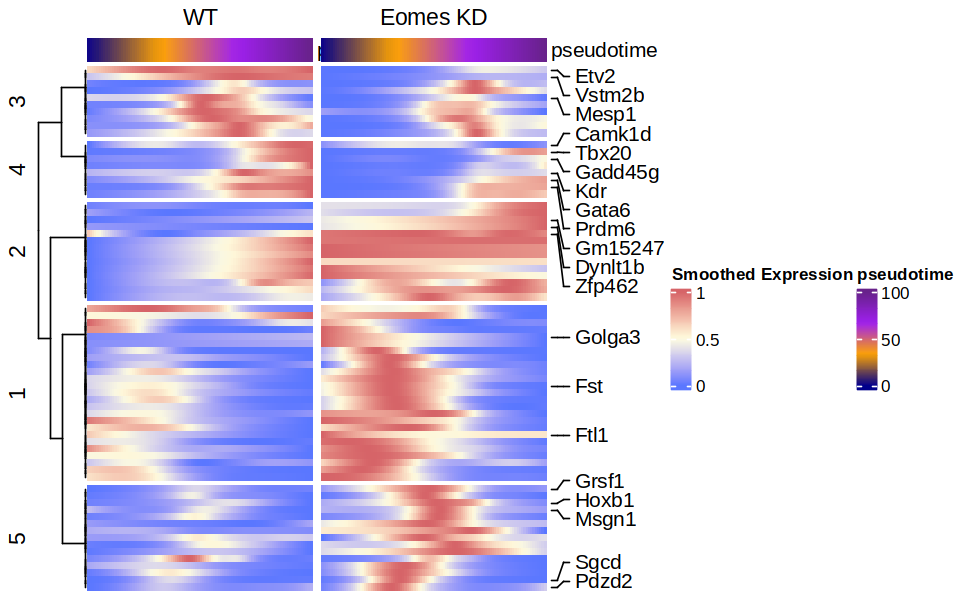

In [135]:
# Clustering
set.seed(42)
k = 5
group = kmeans(yhatSmooth_minmax, centers = k)$cluster
row_clust = cluster_within_group(t(yhatSmooth_minmax), group)

ra = rowAnnotation(foo = anno_mark(at = match(genes_label, rownames(WT)), labels = genes_label))


hm_list = Heatmap(WT, 
                  cluster_rows = row_clust,
                  cluster_columns = FALSE,
                  column_title = 'WT',
                  show_column_names  = FALSE,
                  row_split = k,
                  #row_split = as.data.frame(group), 
                  #km = 6,
                  col = cols,
                  heatmap_legend_param = list(title = 'Smoothed Expression'), 
                  top_annotation = ha) + 
          Heatmap(KO, 
                  cluster_columns = FALSE, 
                  column_title = 'Eomes KD',
                  show_column_names  = FALSE,
                  show_row_names  = FALSE,
                  col = cols,
                  show_heatmap_legend = F, 
                  top_annotation = ha,
                  right_annotation = ra)

options(repr.plot.height=5, repr.plot.width=8)
draw(hm_list)

In [136]:
yhatSmooth <- predictSmooth(sceGAM, gene = rownames(sceGAM), nPoints = 100, tidy=TRUE)


In [138]:
# Maybe just plot with predictSmooth values since they don't go below 0 so look a bit nicer
yhatSmooth <- predictSmooth(sceGAM, gene = rownames(sceGAM), nPoints = 100, tidy=TRUE)

plots = mclapply(1:length(unique(group)), function(x){
    genes = names(group)[group == x]
    
    RNA_filt.dt = as.data.table(yhatSmooth[yhatSmooth$gene %in% genes,]) %>% 
            setnames(c('lineage', 'time', 'yhat'), c('Traj', 'pseudotime', 'Expr')) %>%
            .[,gene:=factor(gene, levels = genes_keep)] %>%
            .[,Traj:=as.character(Traj)]

    p = ggplot(RNA_filt.dt, aes(pseudotime, Expr, color=condition)) + 
        #    geom_point(size=0.2, alpha=0.2) +
            geom_line(linewidth = 1.3) + 
            scale_color_manual(values=c('KO'='red', 'WT'='black'), name='Condition') + 
            scale_x_continuous(expand=c(0.01,0, 0, 0), breaks=c(seq(2, 50, 3))) + 
            scale_y_continuous(expand=c(0,0, 0.1, 0), breaks=seq(0, 1e3, 3)) + 
        #    geom_smooth(se = F) +
            geom_hline(yintercept=0) +
            facet_wrap(~gene, ncol=12, scales='free_y') + 
            theme_bw() + 
            theme(strip.background = element_blank(),
                  text = element_text(size=20),
                  axis.text = element_text(color='black'),
                  axis.text.x = element_text(angle=-45, hjust=0, vjust=1),
                  axis.text.y = element_blank())
    return(p)
}, mc.cores=6)

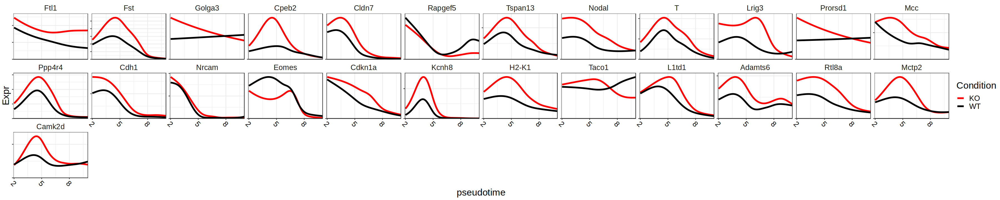

In [139]:
options(repr.plot.height=6, repr.plot.width=30)
plots[[1]]

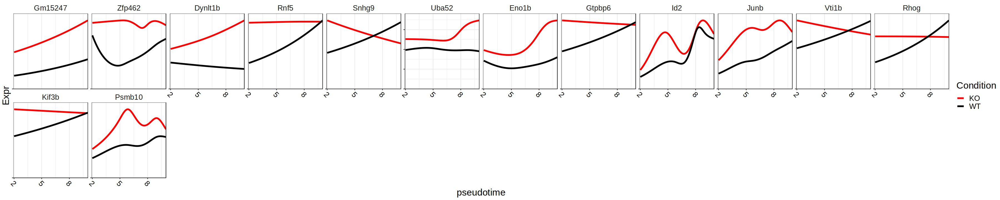

In [140]:
options(repr.plot.height=6, repr.plot.width=30)
plots[[2]]

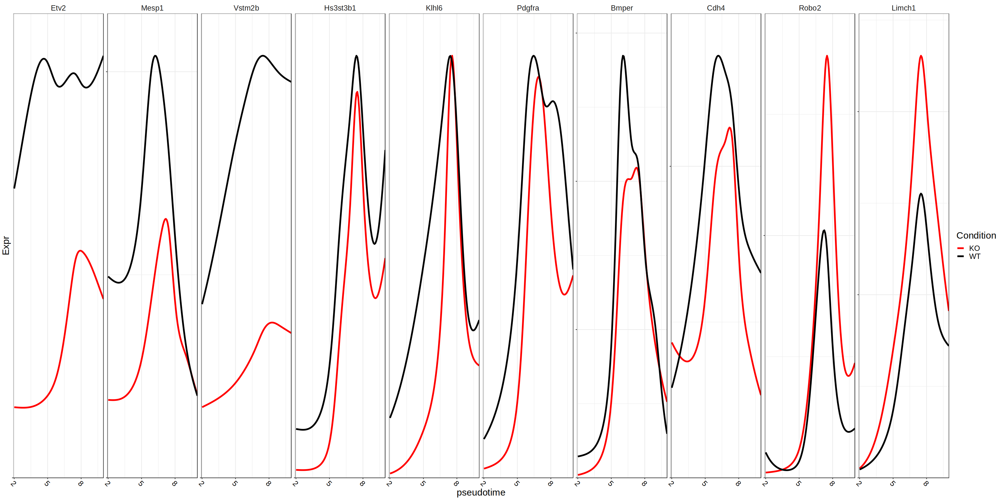

In [141]:
options(repr.plot.height=15, repr.plot.width=30)
plots[[3]]

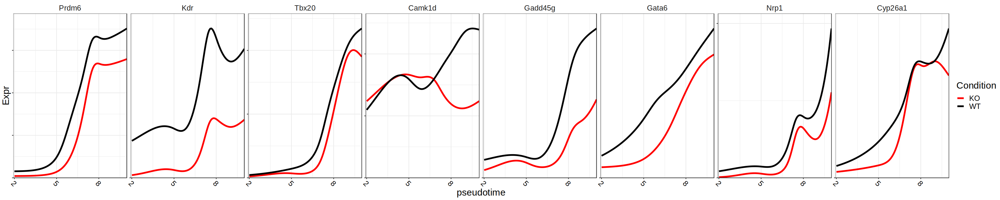

In [142]:
options(repr.plot.height=6, repr.plot.width=30)
plots[[4]]

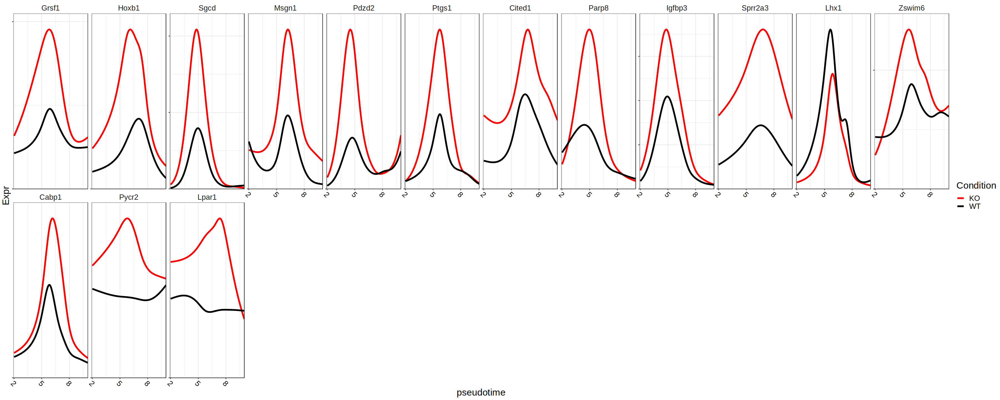

In [143]:
options(repr.plot.height=12, repr.plot.width=30)
plots[[5]]

'select()' returned 1:many mapping between keys and columns



GOALL,Term,Ont,N,DE,P.DE,FDR,enrichment,genes
<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
GO:0003148,outflow tract septum morphogenesis,BP,27,4,2.176150e-07,7.778715e-05,177.14678,"Gata6, Nrp1, Robo2, Tbx20"
GO:0060795,cell fate commitment involved in formation of primary germ layer,BP,32,5,4.486994e-09,2.932827e-06,157.64160,"Eomes, Etv2, Gata6, Mesp1, Nodal"
GO:0035987,endodermal cell differentiation,BP,31,4,4.426792e-07,1.315217e-04,134.38085,"Eomes, Gata6, Mesp1, Nodal"
GO:0001706,endoderm formation,BP,41,5,1.867583e-08,9.494378e-06,96.02915,"Eomes, Gata6, Lhx1, Mesp1, Nodal"
GO:0001707,mesoderm formation,BP,67,6,3.751156e-09,2.600460e-06,43.15215,"Eomes, Etv2, Mesp1, Nodal, T, Msgn1"
GO:0048332,mesoderm morphogenesis,BP,71,6,5.351288e-09,3.179148e-06,38.42690,"Eomes, Etv2, Mesp1, Nodal, T, Msgn1"
GO:0061371,determination of heart left/right asymmetry,BP,67,4,9.516795e-06,1.555112e-03,28.76810,"Mesp1, Nodal, T, Tbx20"
GO:0060976,coronary vasculature development,BP,75,5,4.118780e-07,1.239807e-04,28.69778,"Adamts6, Gata6, Mesp1, Nrp1, Sgcd"
GO:0007492,endoderm development,BP,77,5,4.118780e-07,1.239807e-04,27.22635,"Eomes, Gata6, Lhx1, Mesp1, Nodal"


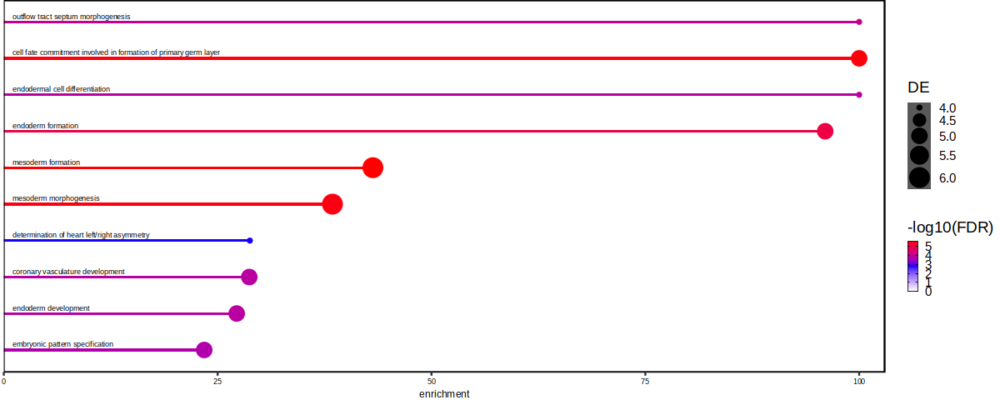

In [144]:
genes = names(group)[group %in% c(1, 3, 5, 4)]
tmp = do_GO(genes, background = rownames(rna.sce))
head(tmp[[1]] %>%
     .[FDR < 0.05] %>% 
     .[Ont == 'BP'] %>% 
     .[N > 20 & N < 1000 & DE > 3 & enrichment > 3] %>% 
     .[order(-enrichment)], 10)
tmp[[2]]


'select()' returned 1:many mapping between keys and columns

Warning message in max(-log10(plot$FDR)):
“no non-missing arguments to max; returning -Inf”
Warning message in max(-log10(plot$FDR)):
“no non-missing arguments to max; returning -Inf”
Warning message in max(plot$enrichment):
“no non-missing arguments to max; returning -Inf”


GOALL,Term,Ont,N,DE,P.DE,FDR,enrichment,genes
<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>


Warning message in max(plot$enrichment):
“no non-missing arguments to max; returning -Inf”


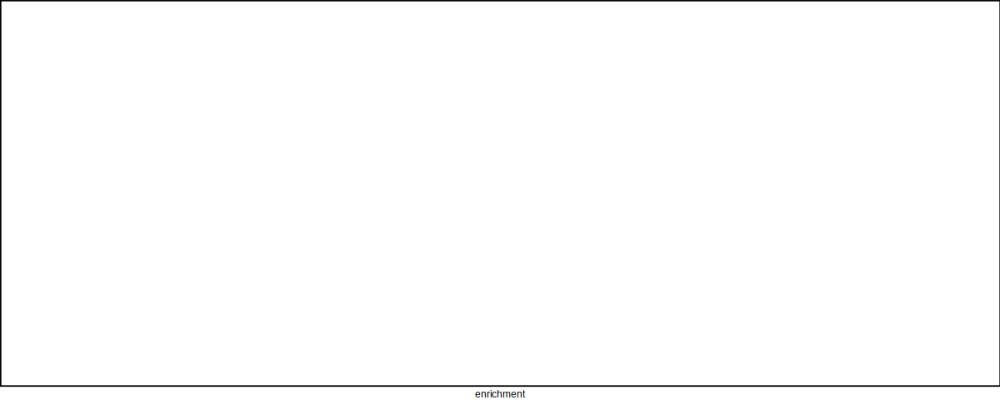

In [145]:

genes = names(group)[group %in% c(2)]
tmp = do_GO(genes, background = rownames(rna.sce))
head(tmp[[1]] %>%
     .[FDR < 0.05] %>% 
     .[Ont == 'BP'] %>% 
     .[N > 20 & N < 1000 & DE > 3 & enrichment > 3] %>% 
     .[order(-enrichment)], 10)
tmp[[2]]


'select()' returned 1:many mapping between keys and columns

Warning message in max(-log10(plot$FDR)):
“no non-missing arguments to max; returning -Inf”
Warning message in max(-log10(plot$FDR)):
“no non-missing arguments to max; returning -Inf”
Warning message in max(plot$enrichment):
“no non-missing arguments to max; returning -Inf”


GOALL,Term,Ont,N,DE,P.DE,FDR,enrichment,genes
<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>


Warning message in max(plot$enrichment):
“no non-missing arguments to max; returning -Inf”


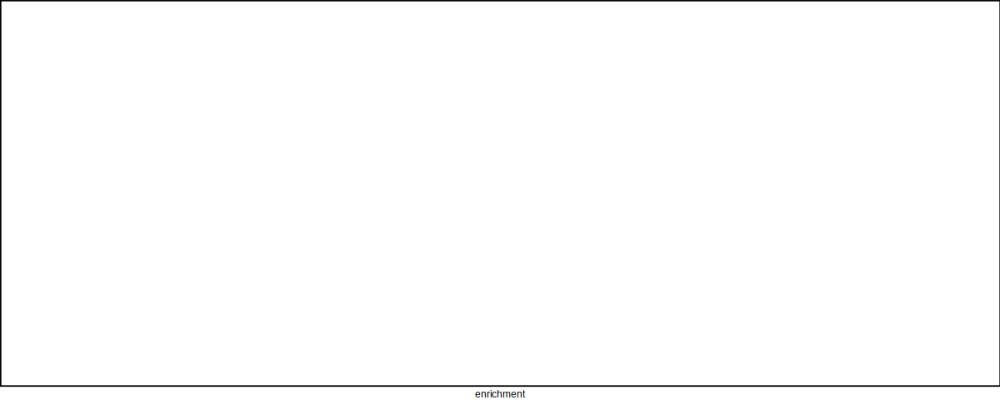

In [146]:

genes = names(group)[group %in% c(3)]
tmp = do_GO(genes, background = rownames(rna.sce))
head(tmp[[1]] %>%
     .[FDR < 0.05] %>% 
     .[Ont == 'BP'] %>% 
     .[N > 20 & N < 1000 & DE > 3 & enrichment > 3] %>% 
     .[order(-enrichment)], 10)
tmp[[2]]



'select()' returned 1:many mapping between keys and columns

Warning message in max(-log10(plot$FDR)):
“no non-missing arguments to max; returning -Inf”
Warning message in max(-log10(plot$FDR)):
“no non-missing arguments to max; returning -Inf”
Warning message in max(plot$enrichment):
“no non-missing arguments to max; returning -Inf”


GOALL,Term,Ont,N,DE,P.DE,FDR,enrichment,genes
<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>


Warning message in max(plot$enrichment):
“no non-missing arguments to max; returning -Inf”


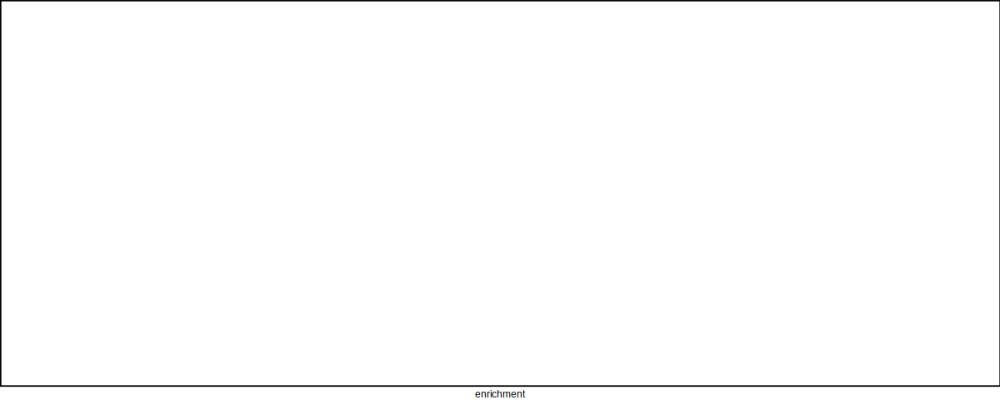

In [147]:
genes = names(group)[group %in% c(4)]
tmp = do_GO(genes, background = rownames(rna.sce))
head(tmp[[1]] %>%
     .[FDR < 0.05] %>% 
     .[Ont == 'BP'] %>% 
     .[N > 20 & N < 1000 & DE > 3 & enrichment > 3] %>% 
     .[order(-enrichment)], 10)
tmp[[2]]



'select()' returned 1:many mapping between keys and columns

Warning message in max(-log10(plot$FDR)):
“no non-missing arguments to max; returning -Inf”
Warning message in max(-log10(plot$FDR)):
“no non-missing arguments to max; returning -Inf”
Warning message in max(plot$enrichment):
“no non-missing arguments to max; returning -Inf”


GOALL,Term,Ont,N,DE,P.DE,FDR,enrichment,genes
<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>


Warning message in max(plot$enrichment):
“no non-missing arguments to max; returning -Inf”


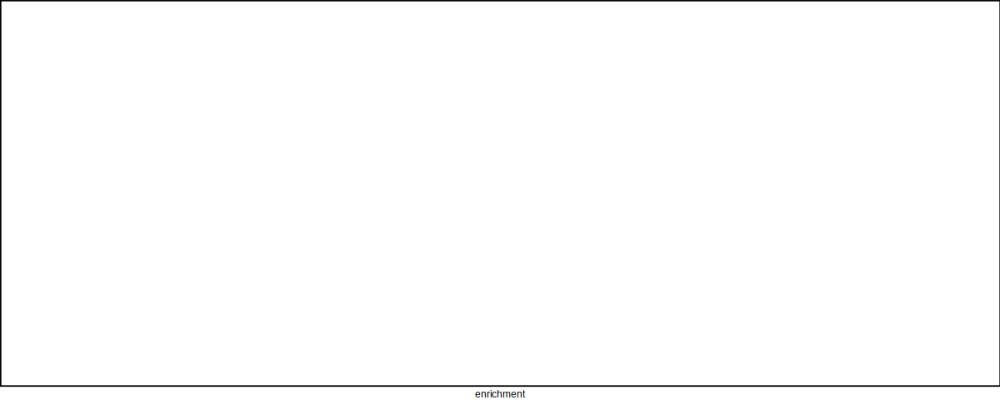

In [148]:
genes = names(group)[group %in% c(5)]
tmp = do_GO(genes, background = rownames(rna.sce))
head(tmp[[1]] %>%
     .[FDR < 0.05] %>% 
     .[Ont == 'BP'] %>% 
     .[N > 20 & N < 1000 & DE > 3 & enrichment > 3] %>% 
     .[order(-enrichment)], 10)
tmp[[2]]

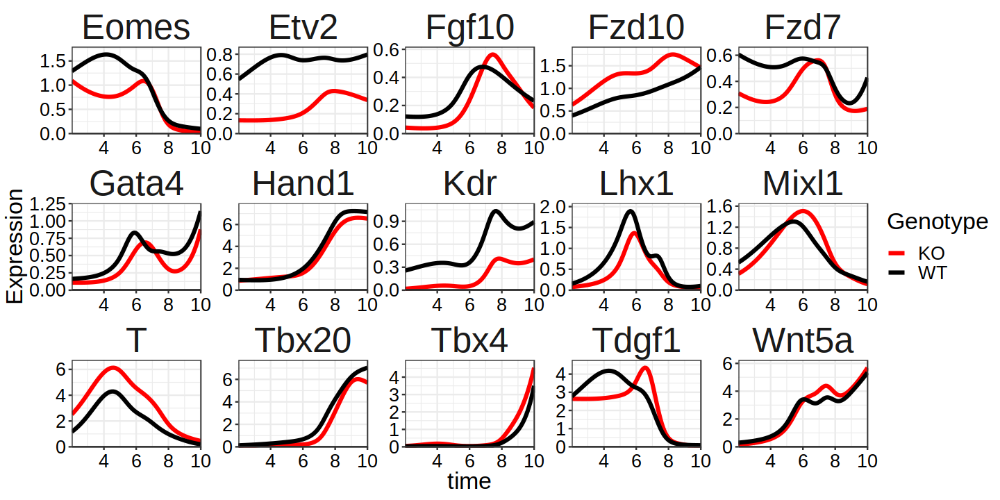

In [153]:
input_gene = c('Gata4', 'Etv2', 'Eomes', 'Kdr', 'Tbx20', 'Mixl1', 'Lhx1', 'Hand1', 'Tbx4', 'Fzd7', 'Fzd10', 'Fgf10', 'Tdgf1', 'Wnt5a', 'Fgf18', 'T')
input_gene = intersect(input_gene, rownames(sceGAM))
yhatSmooth <- as.data.table(predictSmooth(sceGAM, gene = input_gene, nPoints = 100, tidy = TRUE))
options(repr.plot.width = 12, repr.plot.height = 6)
ggplot(yhatSmooth, aes(time, yhat, color = condition)) + 
    geom_line(linewidth = 1.3) + 
    scale_color_manual(values=c('KO'='red', 'WT'='black'), name='Genotype') + 
    scale_x_continuous(expand=c(0.0001,0, 0.001, 0), breaks=c(seq(4, 50, 2))) + 
    scale_y_continuous(expand=c(0,0, 0.1, 0)) + 
    geom_hline(yintercept=0) +
    facet_wrap(~gene, ncol = 5, scales = 'free') + 
    ylab('Expression') + 
    theme_bw() + 
    theme(strip.background = element_blank(),
          text = element_text(size=20),
          strip.text = element_text(size = 30),
          plot.title = element_text(size = 30),
          axis.text = element_text(color='black'),
          axis.text.x = element_text(angle=0, hjust=0.5, vjust=0.5))

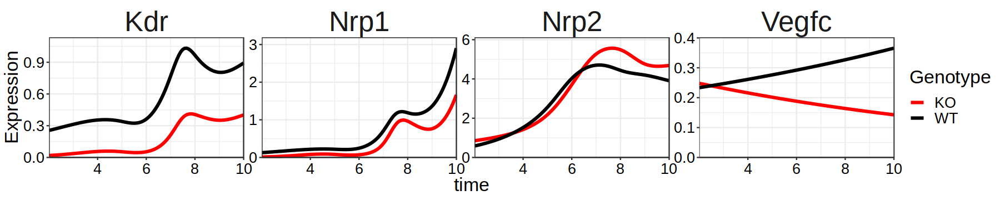

In [150]:
input_gene = c('Vegfc', 'Kdr', 'Flt1', 'Nrp1', 'Nrp2', 'Flt4')
input_gene = intersect(input_gene, rownames(sceGAM))
yhatSmooth <- as.data.table(predictSmooth(sceGAM, gene = input_gene, nPoints = 100, tidy = TRUE))
options(repr.plot.width = 15, repr.plot.height = 3)
ggplot(yhatSmooth, aes(time, yhat, color = condition)) + 
    geom_line(linewidth = 1.3) + 
    scale_color_manual(values=c('KO'='red', 'WT'='black'), name='Genotype') + 
    scale_x_continuous(expand=c(0.0001,0, 0.001, 0), breaks=c(seq(4, 50, 2))) + 
    scale_y_continuous(expand=c(0,0, 0.1, 0)) + 
    geom_hline(yintercept=0) +
    facet_wrap(~gene, ncol = 5, scales = 'free') + 
    ylab('Expression') + 
    theme_bw() + 
    theme(strip.background = element_blank(),
          text = element_text(size=20),
          strip.text = element_text(size = 30),
          plot.title = element_text(size = 30),
          axis.text = element_text(color='black'),
          axis.text.x = element_text(angle=0, hjust=0.5, vjust=0.5))

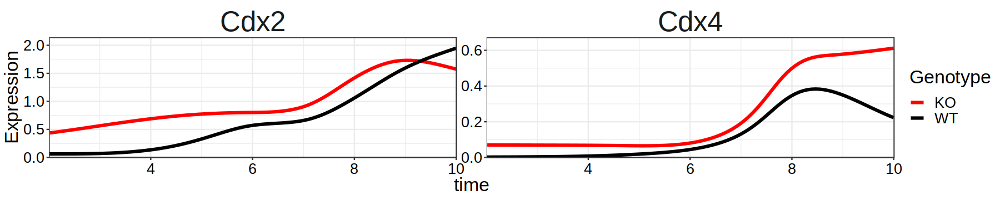

In [41]:
input_gene = c('Cdx2', 'Cdx4', 'Hoxa10', 'Hoxa11')
input_gene = intersect(input_gene, rownames(sceGAM))
yhatSmooth <- as.data.table(predictSmooth(sceGAM, gene = input_gene, nPoints = 100, tidy = TRUE))
options(repr.plot.width = 15, repr.plot.height = 3)
ggplot(yhatSmooth, aes(time, yhat, color = condition)) + 
    geom_line(linewidth = 1.3) + 
    scale_color_manual(values=c('KO'='red', 'WT'='black'), name='Genotype') + 
    scale_x_continuous(expand=c(0.0001,0, 0.001, 0), breaks=c(seq(4, 50, 2))) + 
    scale_y_continuous(expand=c(0,0, 0.1, 0)) + 
    geom_hline(yintercept=0) +
    facet_wrap(~gene, ncol = 5, scales = 'free') + 
    ylab('Expression') + 
    theme_bw() + 
    theme(strip.background = element_blank(),
          text = element_text(size=20),
          strip.text = element_text(size = 30),
          plot.title = element_text(size = 30),
          axis.text = element_text(color='black'),
          axis.text.x = element_text(angle=0, hjust=0.5, vjust=0.5))

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


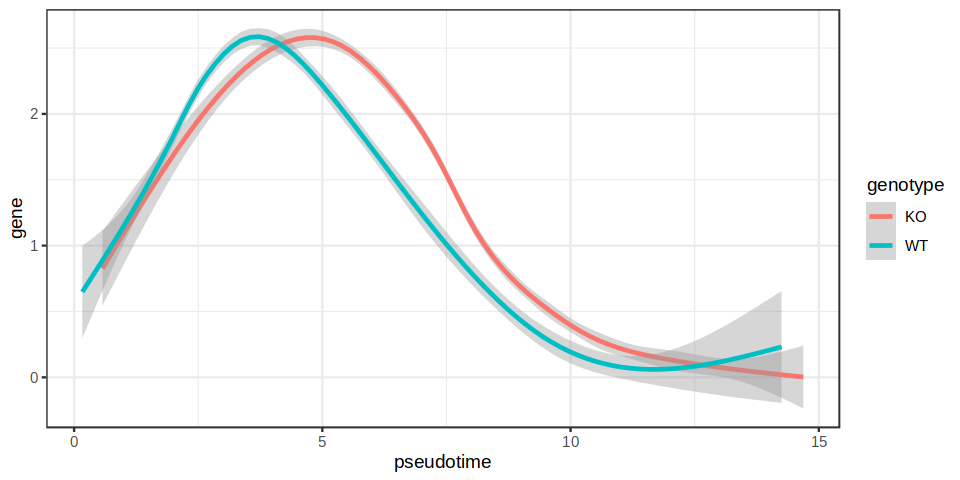

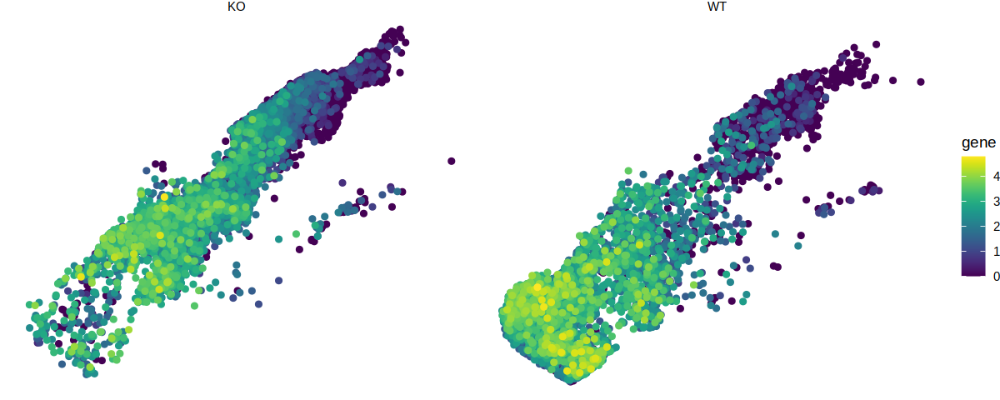

In [42]:
gene = 'T'
meta3 = meta2 %>% copy() %>%
    .[, gene := as.vector(logcounts(rna.sce[gene,meta2$cell]))] %>% 
    .[order(gene)]

options(repr.plot.width = 8, repr.plot.height = 4)
ggplot(meta3, aes(pseudotime, gene, color = genotype)) + 
    geom_smooth() + 
    theme_bw()

options(repr.plot.width = 10, repr.plot.height = 4)
ggplot(meta3, aes(UMAP1, UMAP2, color = gene)) +
    geom_point() +
    viridis::scale_color_viridis() +
    coord_fixed() + 
    facet_wrap(~genotype) + 
    theme_void()

## ATAC analysis

In [28]:
# atac sce
args$peakmtx = file.path(io$basedir, 'processed/atac/archR/Matrices/PeakMatrix_summarized_experiment.rds')

In [32]:
######
#### Find variable peaks
######

# Load RNA sceGAM
sceGAM_RNA = readRDS(file.path(args$outdir, 'sceGAM.rds'))

# load sce atac
atac.sce = readRDS(args$peakmtx)[, colnames(sceGAM_RNA)] # keep only cells from relevant trajectory
colData(atac.sce) = meta2[match(colnames(sceGAM_RNA), cell)] %>% as.data.frame() %>% tibble::column_to_rownames('cell') %>% DataFrame()
atac.sce = as(atac.sce, 'SingleCellExperiment')
assayNames(atac.sce) <- "counts"

# load mofa factors
mofa = fread(file.path(io$basedir, 'results/rna_atac/dimensionality_reduction/mofa/MOFA_factors.txt.gz')) %>% 
    .[match(colnames(atac.sce), cell),] %>% 
    as.data.frame() %>% tibble::column_to_rownames('cell') %>% 
    as.matrix

In [38]:
## First cluster cells at high resolution (replicating meta cells)
# Convert to Seurat
suppressPackageStartupMessages(library(Seurat))
seurat = CreateSeuratObject(counts = counts(atac.sce))
seurat[["mofa"]] <- CreateDimReducObject(embeddings = mofa, key = "mofa_", assay = DefaultAssay(seurat))

# First find high resolution clusters across the whole WT dataset
seurat <- FindNeighbors(seurat, reduction  = 'mofa')
seurat <- FindClusters(seurat, resolution = 1.5)
paste0('Number of Clusters: ', length(unique(Idents(seurat))))

# Pseudobulk ATAC by those clusters
atac.pb = aggregateAcrossCells(atac.sce, id=Idents(seurat), statistics="sum", use.assay.type="counts",  BPPARAM = BPPARAM)

# Normalise
assay(atac.pb,"logcounts") <- log(1e6*(sweep(assay(atac.pb),2,colSums(assay(atac.pb),na.rm=T),"/"))+1)

# Get HVGs
decomp <- modelGeneVar(atac.pb, BPPARAM = MulticoreParam(16)) # [expression$gene,]
decomp <- decomp[decomp$mean > 0.01,]
hvgs <- decomp[order(decomp$FDR),] %>% 
    as.data.table(., keep.rownames=T) 

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 7176
Number of edges: 223221

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7092
Number of communities: 15
Elapsed time: 0 seconds


Warning message:
“UNRELIABLE VALUE: One of the ‘future.apply’ iterations (‘future_lapply-1’) unexpectedly generated random numbers without declaring so. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'future.seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'future.seed = NULL', or set option 'future.rng.onMisuse' to "ignore".”


[1] "Number of Clusters: 15"

Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”


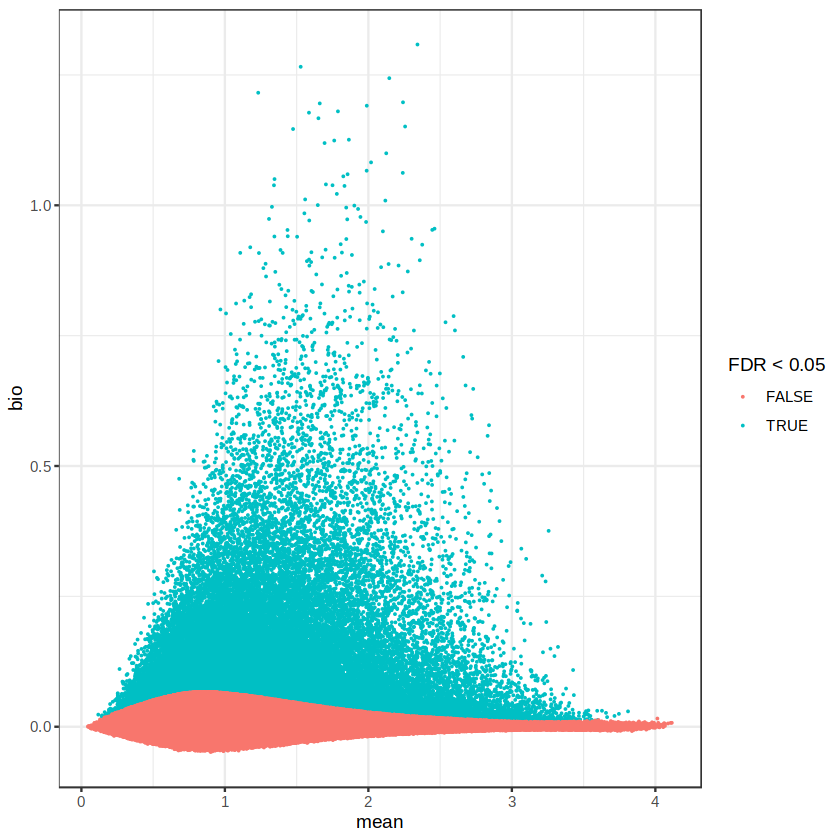

In [39]:
ggplot(hvgs, aes(mean, bio, color = FDR < 0.05)) + 
    geom_point(size = 0.02) + 
    theme_bw()

In [45]:
nrow(hvgs[FDR< 0.05])

[1] 40709

In [46]:
summary(colnames(atac.sce) == colnames(sceGAM))
summary(hvgs$rn %in% rownames(atac.sce))

   Mode    TRUE 
logical    7176 

   Mode    TRUE 
logical  234908 

In [55]:
class(atac.sce$replicate)

[1] "character"

In [57]:
# Export files to run as Rscript
R_script_list = list(cells = colnames(atac.sce),
                     peaks = rownames(atac.sce),
                     peak_stats = hvgs,
                     genotype = atac.sce$genotype,
                     replicate = atac.sce$replicate,
                     pseudotime = pseudotime,
                     weight = weight)

In [59]:
# Get pseudotime and weights from RNA sceGAM (To make sure the exact same weights are used between modalities)
pseudotime = as.data.frame(sceGAM$crv[,c(1)])
weight = as.data.frame(sceGAM$crv[,c(2)])

# Export files to run as Rscript
R_script_list = list(cells = colnames(atac.sce),
                     peaks = rownames(atac.sce),
                     peak_stats = hvgs,
                     genotype = atac.sce$genotype,
                     replicate = atac.sce$replicate,
                     pseudotime = pseudotime,
                     weight = weight)

saveRDS(R_script_list, file.path(args$outdir, 'ATAC_tradeseq_objects.rds'))

In [52]:
# # # Following code ran as Rscript: 09_Eomes_invitro_blood/code/rna_atac/revisions/01_tradeSeq_ATAC_all_peaks.R
# here::i_am("revisions/04_TEomes_interaction/01_AllantoisTrajectory_KDvWT.ipynb")

# source(here::here("settings.R"))
# source(here::here("utils.R"))

# suppressPackageStartupMessages(library(scran))
# suppressPackageStartupMessages(library(scater))
# suppressPackageStartupMessages(library(Seurat))
# suppressPackageStartupMessages(library(dplyr))
# suppressPackageStartupMessages(library(edgeR))
# suppressPackageStartupMessages(library(destiny))
# suppressPackageStartupMessages(library(tradeSeq))
# suppressPackageStartupMessages(library(slingshot))
# suppressPackageStartupMessages(library(BiocParallel))

# BPPARAM <- BiocParallel::bpparam()
# BPPARAM$workers = 24

# # Multi core using future - built in to seurat
# plan("multicore", workers = 16)
# options(future.globals.maxSize = 50 * 1024 ^ 3) # for 50 Gb RAM
# set.seed(6)

# # I/O
# args = list()

# # atac sce
# args$peakmtx = file.path(io$basedir, 'processed/atac/archR/Matrices/PeakMatrix_summarized_experiment.rds')

# # outdir
# args$outdir = file.path(io$basedir, 'results/revisions/04_TEomes_interaction/')
# dir.create(args$outdir, recursive=TRUE, showWarnings =FALSE)

# print('Loading objects')
# R_script_list = readRDS(file.path(args$outdir, 'ATAC_tradeseq_objects.rds'))

# print('loading peak mtx')
# peaks.sce = readRDS(args$peakmtx)[,R_script_list$cells]

# peaks.mtx = peaks.sce@assays@data$PeakMatrix
# rownames(peaks.mtx) = R_script_list$peaks
# colnames(peaks.mtx) = R_script_list$cells

# # Get model matrix
# U <- model.matrix(~R_script_list$replicate)

# print('Running fitGAM')
# sceGAM <- fitGAM(counts = peaks.mtx,
#               #   sds = rna.sce$slingshot,
#                  pseudotime = R_script_list$pseudotime,
#                  conditions = factor(R_script_list$genotype, levels = c('KO', 'WT')), # KD vs WT comparison
#                  cellWeights = R_script_list$weight, # All cells belong to the same trajectory                 
#                  U = U,
#                  nknots=8, 
#             #     genes = unique(R_script_list$peak_gene_correlation[padj<0.05][,1][[1]]), # Keep only peaks that are linked to the differential genes
#                  genes = R_script_list$peak_stats[FDR<0.05, rn],
#                  parallel = TRUE,
#                  BPPARAM=BPPARAM,
#                  verbose=T) 

# saveRDS(sceGAM, file.path(args$outdir, 'sceGAM_ATAC_all_peaks.rds'))

In [3]:
sceGAM = readRDS(file.path(args$outdir, 'sceGAM_ATAC_all_peaks.rds'))

In [148]:
sceGAM

class: SingleCellExperiment 
dim: 40709 7176 
metadata(1): tradeSeq
assays(1): counts
rownames(40709): chr1:7020455-7021055 chr1:7671642-7672242 ...
  chr6:48909092-48909692 chr8:85503060-85503660
rowData names(1): tradeSeq
colnames(7176): 2_Eo_DEG_G9_day3_5_VC#AAACCAACACCCACCT-1
  2_Eo_DEG_G9_day3_5_VC#AAACCAACATTGCGGT-1 ...
  rv_eo_deg_day4_dtag#TTTGTCTAGTTAGTGC-1
  rv_eo_deg_day4_dtag#TTTGTGGCACAAAGAC-1
colData names(2): crv tradeSeq
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):

In [216]:
# Test if l2fc should be changed around? 
condRes <- conditionTest(sceGAM, l2fc = 0)
condRes$padj <- p.adjust(condRes$pvalue, "fdr")

In [217]:
condRes = condRes %>% as.data.table(keep.rownames=T) %>%
    setnames('rn', 'gene') %>%
    .[,sig:=ifelse(padj<=0.05, TRUE, FALSE)] %>%
    .[order(padj, -waldStat)]

In [218]:
nrow(condRes[sig == T])

[1] 5667

In [219]:
yhatSmooth <- as.data.table(predictSmooth(sceGAM, gene = condRes[sig == T, gene], nPoints = 100, tidy=TRUE))

In [220]:
genes_keep = condRes[sig==T, gene]
genes_label = NULL #condRes[sig==T, gene]

trans <- div_gradient_pal(low='#5a77ff', mid='lightyellow', high='#d66468')

cols <- trans(seq(0,1, length.out=20))
# col_fun = colorRamp2(seq(0, 100, 5), viridis::viridis(length(seq(0, 100, 5))))
col_fun = colorRamp2(seq(0, 100, 5), colorRampPalette(c("darkblue", "orange", "purple", 'darkorchid4'))(length(seq(0, 100, 5))))

ha = HeatmapAnnotation(pseudotime = 1:100,
                       col = list(pseudotime = col_fun))

yhatSmooth <- predictSmooth(sceGAM, gene = genes_keep, nPoints = 100, tidy = FALSE)

# minmax normalisation 
minmax = function(x){(x-min(x))/(max(x)-min(x))}
yhatSmooth_minmax = t(apply(yhatSmooth, 1, minmax)) 

WT = yhatSmooth_minmax[, grepl('lineage1_conditionWT', colnames(yhatSmooth_minmax))]
KO = yhatSmooth_minmax[, grepl('lineage1_conditionKO', colnames(yhatSmooth_minmax))]

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.



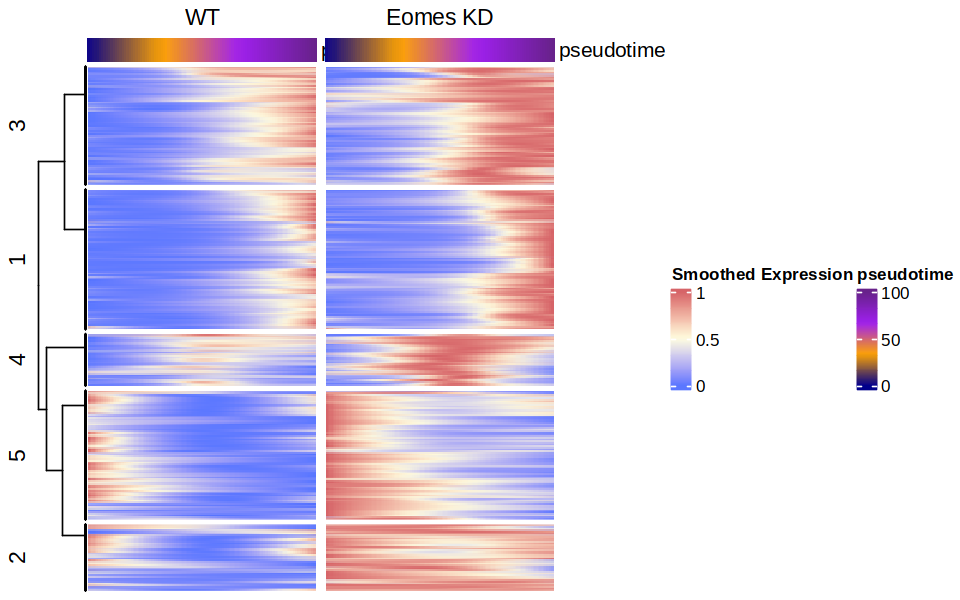

In [221]:
# Clustering
set.seed(42)
k = 5
group = kmeans(yhatSmooth_minmax, centers = k)$cluster
row_clust = cluster_within_group(t(yhatSmooth_minmax), group)

ra = rowAnnotation(foo = anno_mark(at = match(genes_label, rownames(WT)), labels = genes_label))


hm_list = Heatmap(WT, 
                  cluster_rows = row_clust,
                  cluster_columns = FALSE,
                  column_title = 'WT',
                  show_column_names  = FALSE,
                  row_split = k,
                  #row_split = as.data.frame(group), 
                  #km = 6,
                  col = cols,
                  heatmap_legend_param = list(title = 'Smoothed Expression'), 
                  top_annotation = ha) + 
          Heatmap(KO, 
                  cluster_columns = FALSE, 
                  column_title = 'Eomes KD',
                  show_column_names  = FALSE,
                  show_row_names  = FALSE,
                  col = cols,
                  show_heatmap_legend = F, 
                  top_annotation = ha,
                  right_annotation = ra)

options(repr.plot.height=5, repr.plot.width=8)
draw(hm_list)

In [222]:
# matches <- getMatches(ArchRProject, 'Motif_cisbp')
# rownames(matches) = rownames(atac.sce)

io$multiome = '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/multiome_atlas/'
silico_chip = readRDS(file.path(io$multiome, 'vitro_peaks_silicoChIP_cisbp.rds'))
assay(silico_chip, 'matches') = assay(silico_chip, 'VirtualChipScores') > 0.2 # keep only motifs with in silico score > 0.2
assay(silico_chip, 'motifScores') = NULL
assay(silico_chip, 'motifMatches') = NULL
assay(silico_chip, 'motifCounts') = NULL
assay(silico_chip, 'VirtualChipScores') = NULL
matches = silico_chip


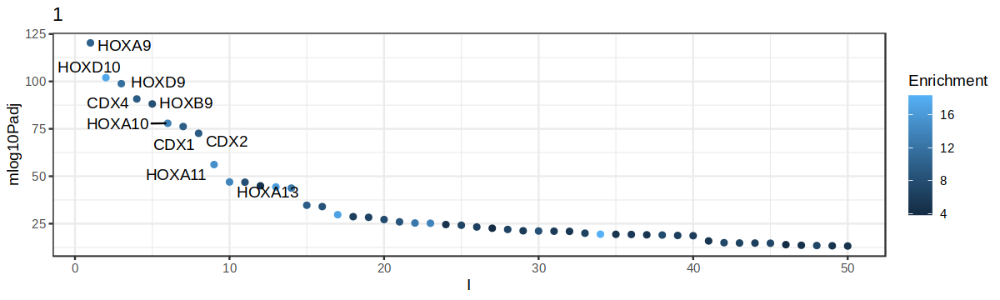

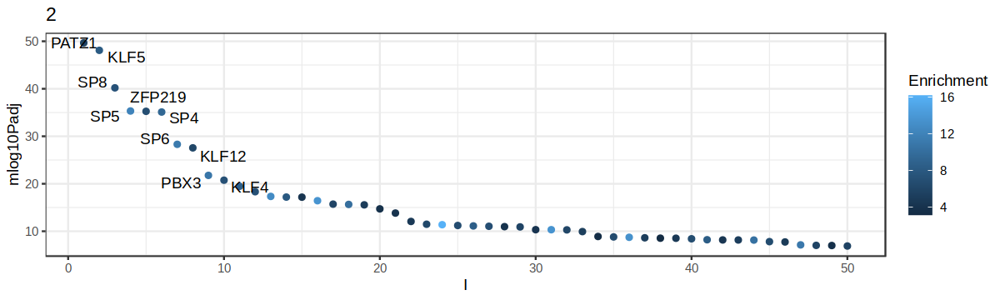

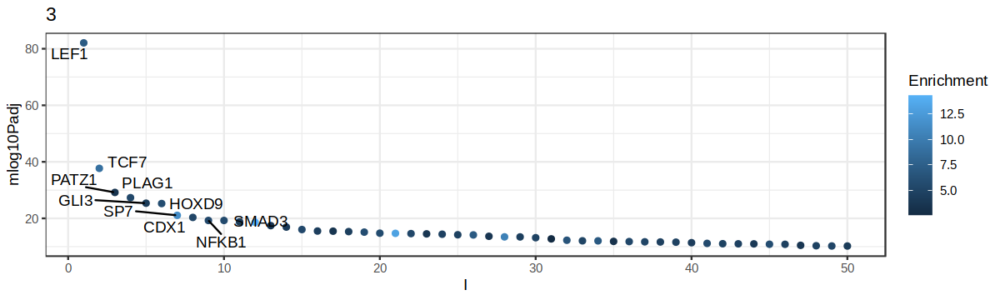

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]


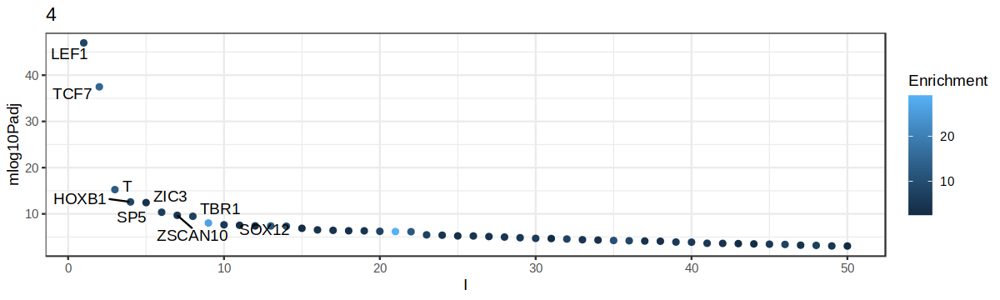

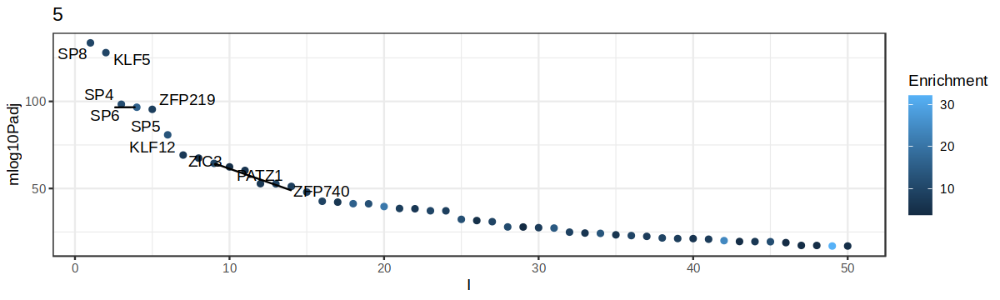

In [223]:
options(repr.plot.width = 10, repr.plot.height = 3)

lapply(1:5, function(x){
    genes = names(group)[group == x]
    tmp2 = as.data.table(ArchR:::.computeEnrichment(matches, genes, seq_len(nrow(matches)))) %>%
            .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
            .[mlog10Padj > -log10(0.05)]

    to.plot = tmp2[order(-mlog10Padj)] %>% .[,I := .I]
    ggplot(head(to.plot, 50), aes(I, mlog10Padj, color = Enrichment)) + 
        geom_point() + 
        ggrepel::geom_text_repel(data = head(to.plot,10), aes(label = feature), color = 'black') + 
        ggtitle(x) + 
        theme_bw()
})


In [247]:
args$vitro_bws = file.path(io$basedir, 'processed/atac/archR/GroupBigWigs/celltypeV2_genotype/')

bigwigs.data_vitro = data.table(celltype = list.files(args$vitro_bws, 'bw') %>% str_split(., '\\.') %>% map_chr(1),
                    genotype = list.files(args$vitro_bws, 'bw') %>% str_split(., '\\.') %>% map_chr(2) %>% str_split('-') %>% map_chr(1),
                    path =  paste0(args$vitro_bws, list.files(args$vitro_bws, 'bw'))) %>% 
                .[,name := gsub('KO', 'KD', paste0(celltype, ' ', genotype))] %>% 
                .[,color := ifelse(genotype == 'KO', '#FF0000', '#000000')]

In [280]:
WT_plot$name

[1] Eomes ChIP             T ChIP                 Primitive_Streak KD   
 [4] Primitive_Streak WT    Early_Mes_EOi KD       Early_Mes_EOi WT      
 [7] Posterior_Mes KD       Posterior_Mes WT       Allantois_Precursor KD
[10] Allantois_Precursor WT
10 Levels: Allantois_Precursor KD Allantois_Precursor WT ... T ChIP

In [304]:
chips = data.table(
    celltype = 'ChIP',
    genotype = '',
    path = c('/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/ChIP/Eomes/GSE128466/GSE128466_bamCoverage_ChIP_EoGFP_dox.bigwig',
            '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/ChIP/Eomes/GSE128466/GSE128466_bamCoverage_ChIP_BraGFP_dox.bigwig'),
    name = c('.       Eomes ChIP', '.        T ChIP'),
    color = c('darkgreen', 'darkblue')
)

In [305]:
chips

celltype,genotype,path,name,color
<chr>,<chr>,<chr>,<chr>,<chr>
ChIP,,/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/ChIP/Eomes/GSE128466/GSE128466_bamCoverage_ChIP_EoGFP_dox.bigwig,. Eomes ChIP,darkgreen
ChIP,,/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/ChIP/Eomes/GSE128466/GSE128466_bamCoverage_ChIP_BraGFP_dox.bigwig,. T ChIP,darkblue


In [306]:
bigwigs.data = rbind(bigwigs.data_vitro, chips)

In [307]:
unique(bigwigs.data$celltype)

[1] "Allantois_Precursor" "Allantois"           "Blood_Progenitor"   
 [4] "Early_Mes_EOd"       "Early_Mes_EOi"       "Endothelium"        
 [7] "HE_Precursor"        "HE"                  "Mesenchyme"         
[10] "PGC"                 "Posterior_Mes"       "Primitive_Streak"   
[13] "ChIP"

In [308]:
celltypes = c('ChIP', 'Primitive_Streak', 'Early_Mes_EOi', 'Posterior_Mes', 'Allantois_Precursor')

WT_plot = bigwigs.data %>% copy() %>%
    .[celltype %in% celltypes] %>%
    .[, celltype := factor(celltype, levels = celltypes)] %>%
    .[order(celltype)] %>% 
    .[, name := as.factor(name)]

In [310]:
head(WT_plot)

celltype,genotype,path,name,color
<fct>,<chr>,<chr>,<fct>,<chr>
ChIP,,/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/ChIP/Eomes/GSE128466/GSE128466_bamCoverage_ChIP_EoGFP_dox.bigwig,. Eomes ChIP,darkgreen
ChIP,,/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/ChIP/Eomes/GSE128466/GSE128466_bamCoverage_ChIP_BraGFP_dox.bigwig,. T ChIP,darkblue
Primitive_Streak,KO,/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/Primitive_Streak.KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw,Primitive_Streak KD,#FF0000
Primitive_Streak,WT,/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/Primitive_Streak.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw,Primitive_Streak WT,#000000
Early_Mes_EOi,KO,/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/Early_Mes_EOi.KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw,Early_Mes_EOi KD,#FF0000
Early_Mes_EOi,WT,/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/Early_Mes_EOi.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw,Early_Mes_EOi WT,#000000


In [285]:
ArchRProject = loadArchRProject(io$archR.directory)

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

In [257]:
nrow(WT_plot)

[1] 10

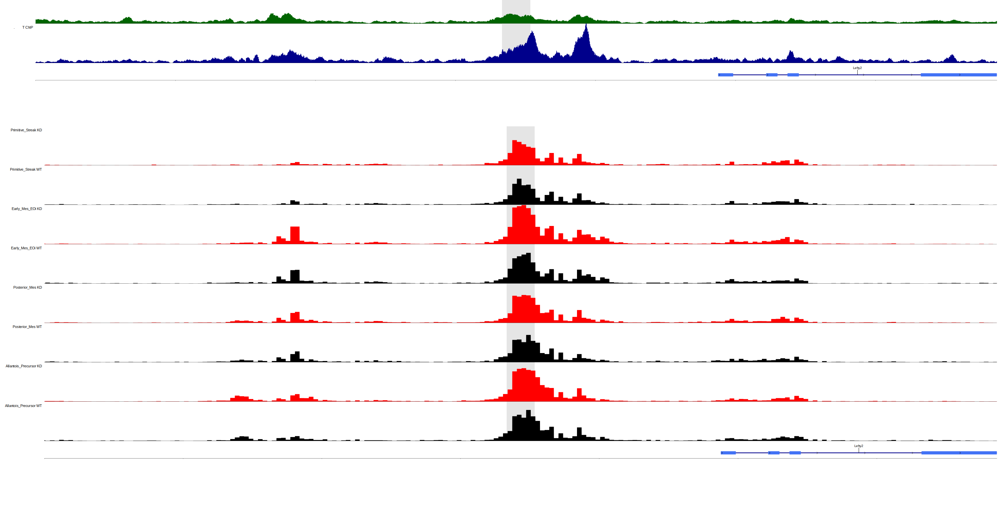

In [315]:
input_region = condRes[1, gene]
extend = 1e4
options(repr.plot.width = 25, repr.plot.height = 13)
ggarrange(plot_browser_track(gene = NULL, # gene used for plotting expression
                              input_region = input_region, # Region used
                              bigwigs = WT_plot[1:2], 
                              extend.upstream = extend,
                              extend.downstream = extend, 
                              highlight_regions = input_region, #if(length(tmp1$peak)>0){tmp1$peak}else{NULL},
                              downsample.rate = 1, 
                              no_label = F, 
                              plot_expression = F,
                              background_color = 'white',
                              highlight_color = 'grey90',
                              bw_height = 25, 
                              gene_height = 10,
                              bw_width = 200,
                              expr_width = 0),

plot_browser_track(gene = NULL, # gene used for plotting expression
                              input_region = input_region, # Region used
                              bigwigs = WT_plot[3:10], 
                              extend.upstream = extend,
                              extend.downstream = extend, 
                              highlight_regions = input_region, #if(length(tmp1$peak)>0){tmp1$peak}else{NULL},
                              downsample.rate = 1, 
                              no_label = F, 
                              plot_expression = F,
                              background_color = 'white',
                              highlight_color = 'grey90',
                              bw_height = 25, 
                              gene_height = 10,
                              bw_width = 200,
                              expr_width = 0),
          ncol = 1, 
          heights = c(1, 7)
)

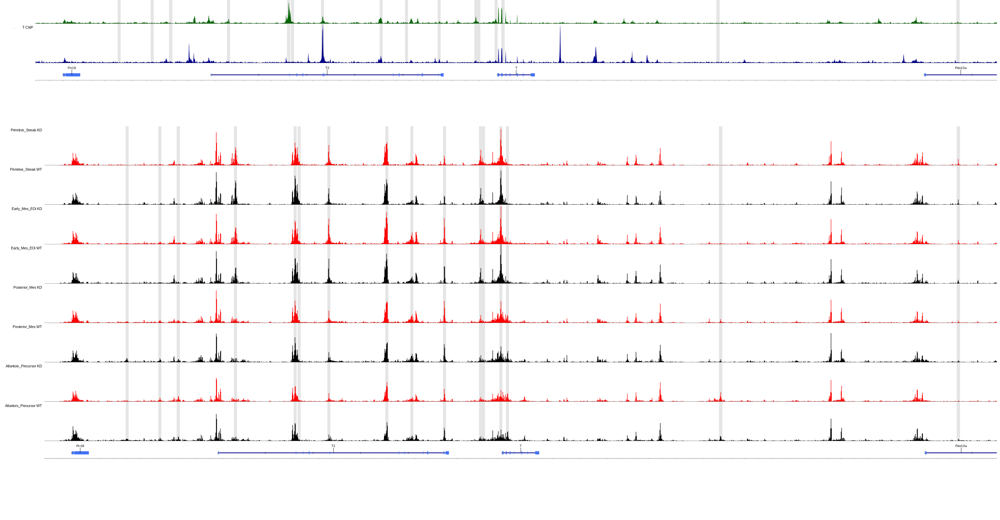

In [320]:
input_region = condRes[sig == T, gene]
extend = 1e5
options(repr.plot.width = 25, repr.plot.height = 13)
ggarrange(plot_browser_track(gene = 'T', # gene used for plotting expression
                              input_region = NULL, # Region used
                              bigwigs = WT_plot[1:2], 
                              extend.upstream = extend,
                              extend.downstream = extend, 
                              highlight_regions = input_region, #if(length(tmp1$peak)>0){tmp1$peak}else{NULL},
                              downsample.rate = 1, 
                              no_label = F, 
                              plot_expression = F,
                              background_color = 'white',
                              highlight_color = 'grey90',
                              bw_height = 25, 
                              gene_height = 10,
                              bw_width = 200,
                              expr_width = 0),

plot_browser_track(gene = 'T', # gene used for plotting expression
                              input_region = NULL, # Region used
                              bigwigs = WT_plot[3:10], 
                              extend.upstream = extend,
                              extend.downstream = extend, 
                              highlight_regions = input_region, #if(length(tmp1$peak)>0){tmp1$peak}else{NULL},
                              downsample.rate = 1, 
                              no_label = F, 
                              plot_expression = F,
                              background_color = 'white',
                              highlight_color = 'grey90',
                              bw_height = 25, 
                              gene_height = 10,
                              bw_width = 200,
                              expr_width = 0),
          ncol = 1, 
          heights = c(1, 7)
)

# No cell-type filtering

## Pre-processing

In [95]:
# Load meta
meta = fread(args$metadata)[day %in% c('D3.5', 'D4', 'D4.5', 'D5')] %>% # Remove D3 for KD vs WT comparison
    .[celltype_v2 %in% c('Primitive_Streak', 'Early_Mes_EOi','Early_Mes_EOd','Posterior_Mes','HE_Precursor', 'HE', 'Allantois_Precursor')]

In [96]:
# load sce
rna.sce <- load_SingleCellExperiment(args$rna_sce, normalise = F, cells = meta$cell)

In [97]:
# Assign cells to lineage, doing this now to make sure it's consistent
# Notice, assignCells is not fixed in which cells are assigned which lineage, even after setting a seed!
set.seed(42)
assign_lineages = tradeSeq:::.assignCells(assays(rna.sce$slingshot)$weights)
#colnames(assign_lineages) = c('Trajectory1', 'Trajectory2')
pseudotime = slingPseudotime(rna.sce$slingshot, na=T)

Traj_assignment = as.data.table(assign_lineages, keep.rownames=T) %>%
    setnames(c('cell', paste0('Trajectory', 1:(length(.)-1))))

Traj1 = as.data.table(pseudotime[,1], keep.rownames=T) %>% 
    .[V1 %in% Traj_assignment[Trajectory1 == 1, cell]] #%>% 
   # .[V2>5 & V2<10]

Traj2 = as.data.table(pseudotime[,2], keep.rownames=T) %>% 
    .[V1 %in% Traj_assignment[Trajectory2 == 1, cell]] #%>% 
    #.[V2>5 & V2<10]

In [98]:
# Combine & add which trajectory
Traj_full = rbind(Traj1[,Traj:='Trajectory1'], Traj2[,Traj:='Trajectory2']) %>%
    setnames(c('cell', 'pseudotime', 'Traj'))

In [99]:
# Add trajectory info to metadata
meta2 = rbind(meta[cell %in% Traj_assignment[Trajectory1==1, cell]] %>% 
                  .[, trajectory := 'Traj1'] %>%
                  .[, pseudotime := colData(rna.sce[,cell])$slingPseudotime_1],
              meta[cell %in% Traj_assignment[Trajectory2==1, cell]] %>%
                  .[, trajectory := 'Traj2'] %>%
                  .[, pseudotime := colData(rna.sce[,cell])$slingPseudotime_2])

# Keep only Allantois trajectory 
meta2 = meta2[trajectory == 'Traj2']

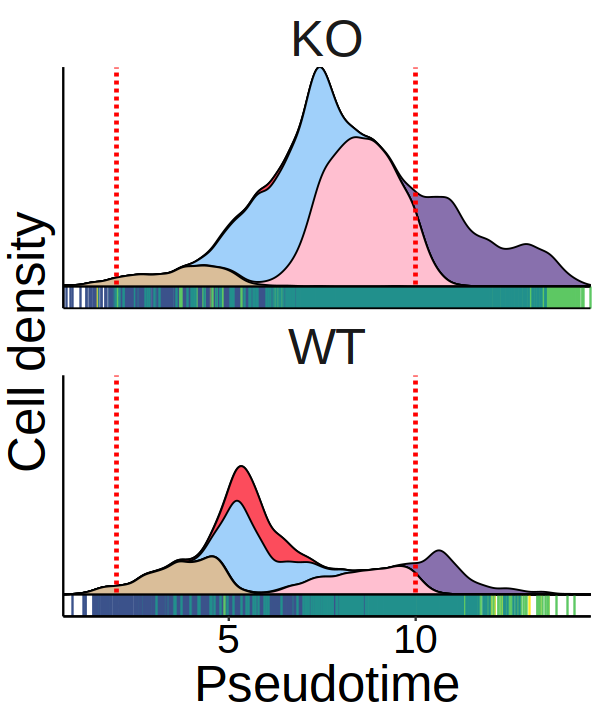

In [173]:
# facet_labels = c()
p1 = ggplot(meta2, aes(pseudotime, fill=celltype_v2)) + 
    # geom_histogram(binwidth=0.1, position='stack') + 
    geom_density(aes(y = after_stat(density * n/10)), position = 'stack', color = 'black', linewidth = 0.4, bw = 0.2) + 
    scale_colour_manual(values = opts$days.colors, name='day') + 
    scale_fill_manual(values = opts$celltype_v2.colors, name='Celltype') +
    scale_x_continuous(expand=c(0,0)) + 
    scale_y_continuous(expand=c(0,0)) + 
    geom_vline(xintercept = c(2, 10), color='red', linetype = 'dashed', linewidth = 1) + 
    xlab('Pseudotime') + ylab('Cell density') + 
    facet_wrap(~genotype, ncol = 1, 
               scales='fixed', 
               labeller = labeller(trajectory = c('Traj1' = 'Trajectory 1', 'Traj2' = 'Trajectory 2'))) + 
    theme_classic() + 
    theme(text = element_text(size=30),
          axis.text = element_text(color='black'),
          axis.text.y = element_blank(),
          axis.ticks.y = element_blank(),
          strip.background = element_blank(),
          strip.text = element_text(size=30),
          legend.position='none')
p1_values = ggplot_build(p1)
p1 = p1 +    
    geom_segment(aes(x = pseudotime, xend = pseudotime, y = 0, yend = -max(p1_values$data[[1]]$ymax)/10, col=day)) + 
    geom_hline(yintercept=c(0,-max(p1_values$data[[1]]$ymax)/10), color='black')

options(repr.plot.width = 5, repr.plot.height=6)
p1

In [174]:
rna.sce

class: SingleCellExperiment 
dim: 32285 21703 
metadata(0):
assays(1): counts
rownames(32285): Xkr4 Gm1992 ... AC234645.1 AC149090.1
rowData names(0):
colnames(21703): 2_Eo_DEG_G9_day3_5_VC#AAACAGCCAAAGCGGC-1
  2_Eo_DEG_G9_day3_5_VC#AAACAGCCAACCTAAT-1 ...
  rv_eo_deg_day4_dtag#TTTGTGTTCATTTGTC-1
  rv_eo_deg_day4_dtag#TTTGTTGGTACTTAGG-1
colData names(29): barcode sample ... slingPseudotime_1
  slingPseudotime_2
reducedDimNames(4): pca mofa mofa_umap DiffusionMap
mainExpName: RNA
altExpNames(0):

In [103]:
rna.sce = logNormCounts(rna.sce)

In [104]:
# Keep only cells within pseudotime window for analysis
pseudo_min = 2 # Previously had 4 -> 10
pseudo_max = 10

within_pseudotime_cells = meta2[pseudotime > pseudo_min & pseudotime <= pseudo_max, cell]

In [105]:
length(within_pseudotime_cells)

[1] 7652

## RNA Analysis

In [106]:
## Filter genes
#By minimum expression cdr
expression = data.table(gene = rownames(rna.sce),
                      KO_cdr = rowMeans(logcounts(rna.sce[,meta[cell %in% within_pseudotime_cells & genotype == 'KO', cell]])>0),
                       WT_cdr = rowMeans(logcounts(rna.sce[,meta[cell %in% within_pseudotime_cells & genotype == 'WT', cell]])>0))
genes_test = expression[KO_cdr > 0.15 | WT_cdr > 0.15, gene]

In [107]:
length(genes_test)

[1] 8763

In [108]:
U <- model.matrix(~rna.sce[, within_pseudotime_cells]$replicate)

In [109]:
summary(rownames(slingPseudotime(rna.sce$slingshot)[within_pseudotime_cells,]) ==
       colnames(counts(rna.sce[, within_pseudotime_cells])))

   Mode    TRUE 
logical    7652 

In [182]:
BPPARAM$workers = 12
sceGAM <- fitGAM(counts = counts(rna.sce[, within_pseudotime_cells]),
                 pseudotime = slingPseudotime(rna.sce$slingshot)[within_pseudotime_cells,2], # Only use traj 2 pseudotime
                 conditions = as.factor(rna.sce[,within_pseudotime_cells]$genotype), # KD vs WT comparison
                 cellWeights = rep(1, length(within_pseudotime_cells)), # All cells belong to the same trajectory
                 U = U, # Don't use replicates for test
                 nknots=8, 
                 genes = genes_test, # Only look at top 10k genes --> should probably reduce this further since it's already a ton, would improve FDR 
                 parallel = T,
                 BPPARAM=BPPARAM,
                 verbose=T)

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.8 GiB”
Fitting lineages with multiple conditions. This method has been tested on a couple of datasets, but is still in an experimental phase.



  |======================================================================| 100%



In [183]:
saveRDS(sceGAM, file.path(args$outdir, 'sceGAM_v2.rds'))

In [3]:
sceGAM = readRDS(file.path(args$outdir, 'sceGAM_v2.rds'))

In [10]:
# Test if l2fc should be changed around? Higher than 0.75 rather than lower
condRes <- conditionTest(sceGAM, l2fc = 0.5)
condRes$padj <- p.adjust(condRes$pvalue, "fdr")

In [11]:
condRes = condRes %>% as.data.table(keep.rownames=T) %>%
    setnames('rn', 'gene') %>%
    .[,sig:=ifelse(padj<=0.05, TRUE, FALSE)] %>%
    .[order(padj, -waldStat)]

In [12]:
fwrite(condRes, file.path(args$outdir, 'condRes_RNA_v2.txt.gz'))

In [13]:
condRes = fread(file.path(args$outdir, 'condRes_RNA_v2.txt.gz'))

In [14]:
nrow(condRes[sig == T])

[1] 129

In [15]:
yhatSmooth <- as.data.table(predictSmooth(sceGAM, gene = rownames(sceGAM), nPoints = 100, tidy=TRUE))

In [16]:
genes_keep = condRes[sig==T, gene]
genes_label = condRes[sig==T, gene][1:20]

trans <- div_gradient_pal(low='#5a77ff', mid='lightyellow', high='#d66468')

cols <- trans(seq(0,1, length.out=20))
# col_fun = colorRamp2(seq(0, 100, 5), viridis::viridis(length(seq(0, 100, 5))))
col_fun = colorRamp2(seq(0, 100, 5), colorRampPalette(c("darkblue", "orange", "purple", 'darkorchid4'))(length(seq(0, 100, 5))))

ha = HeatmapAnnotation(pseudotime = 1:100,
                       col = list(pseudotime = col_fun))

yhatSmooth <- predictSmooth(sceGAM, gene = genes_keep, nPoints = 100, tidy = FALSE)

# minmax normalisation 
minmax = function(x){(x-min(x))/(max(x)-min(x))}
yhatSmooth_minmax = t(apply(yhatSmooth, 1, minmax)) 

WT = yhatSmooth_minmax[, grepl('lineage1_conditionWT', colnames(yhatSmooth_minmax))]
KO = yhatSmooth_minmax[, grepl('lineage1_conditionKO', colnames(yhatSmooth_minmax))]

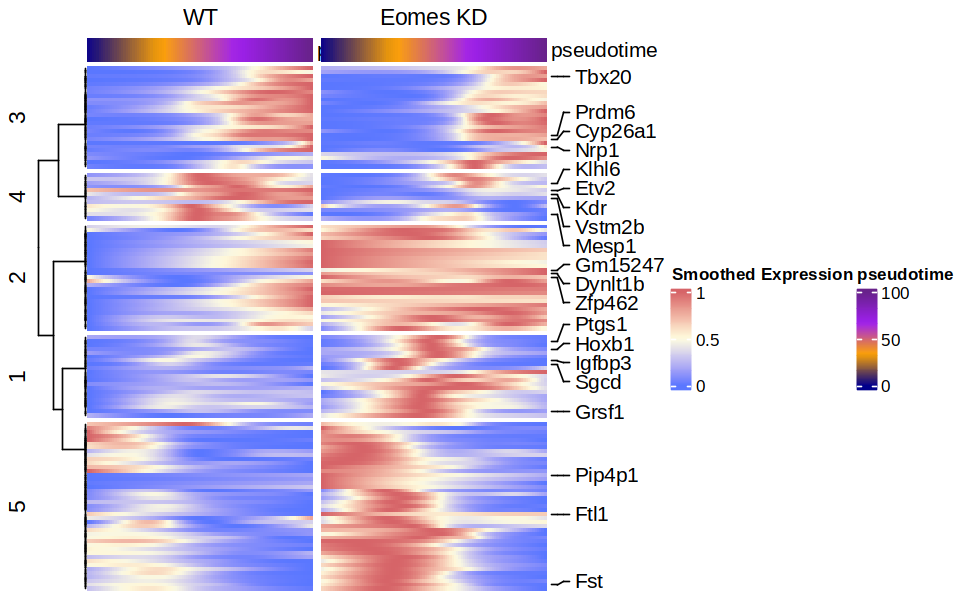

In [17]:
# Clustering
set.seed(42)
k = 5
group = kmeans(yhatSmooth_minmax, centers = k)$cluster
row_clust = cluster_within_group(t(yhatSmooth_minmax), group)

ra = rowAnnotation(foo = anno_mark(at = match(genes_label, rownames(WT)), labels = genes_label))


hm_list = Heatmap(WT, 
                  cluster_rows = row_clust,
                  cluster_columns = FALSE,
                  column_title = 'WT',
                  show_column_names  = FALSE,
                  row_split = k,
                  #row_split = as.data.frame(group), 
                  #km = 6,
                  col = cols,
                  heatmap_legend_param = list(title = 'Smoothed Expression'), 
                  top_annotation = ha) + 
          Heatmap(KO, 
                  cluster_columns = FALSE, 
                  column_title = 'Eomes KD',
                  show_column_names  = FALSE,
                  show_row_names  = FALSE,
                  col = cols,
                  show_heatmap_legend = F, 
                  top_annotation = ha,
                  right_annotation = ra)

options(repr.plot.height=5, repr.plot.width=8)
draw(hm_list)

In [18]:
yhatSmooth <- predictSmooth(sceGAM, gene = rownames(sceGAM), nPoints = 100, tidy=TRUE)


In [19]:
head(yhatSmooth)

,lineage,time,condition,gene,yhat
,<int>,<dbl>,<chr>,<chr>,<dbl>
1,1,2.016145,KO,Xkr4,3.111572
2,1,2.096775,KO,Xkr4,3.200994
3,1,2.177405,KO,Xkr4,3.292392
4,1,2.258034,KO,Xkr4,3.385257
5,1,2.338664,KO,Xkr4,3.479020
6,1,2.419293,KO,Xkr4,3.573053


In [20]:
# Maybe just plot with predictSmooth values since they don't go below 0 so look a bit nicer
yhatSmooth <- predictSmooth(sceGAM, gene = rownames(sceGAM), nPoints = 100, tidy=TRUE)

plots = mclapply(1:length(unique(group)), function(x){
    genes = names(group)[group == x]
    
    RNA_filt.dt = as.data.table(yhatSmooth[yhatSmooth$gene %in% genes,]) %>% 
            setnames(c('lineage', 'time', 'yhat'), c('Traj', 'pseudotime', 'Expr')) %>%
            .[,gene:=factor(gene, levels = genes_keep)] %>%
            .[,Traj:=as.character(Traj)]

    p = ggplot(RNA_filt.dt, aes(pseudotime, Expr, color=condition)) + 
        #    geom_point(size=0.2, alpha=0.2) +
            geom_line(linewidth = 1.3) + 
            scale_color_manual(values=c('KO'='red', 'WT'='black'), name='Condition') + 
            scale_x_continuous(expand=c(0.01,0, 0, 0), breaks=c(seq(2, 50, 3))) + 
            scale_y_continuous(expand=c(0,0, 0.1, 0), breaks=seq(0, 1e3, 3)) + 
        #    geom_smooth(se = F) +
            geom_hline(yintercept=0) +
            facet_wrap(~gene, ncol=12, scales='free_y') + 
            theme_bw() + 
            theme(strip.background = element_blank(),
                  text = element_text(size=20),
                  axis.text = element_text(color='black'),
                  axis.text.x = element_text(angle=-45, hjust=0, vjust=1),
                  axis.text.y = element_blank())
    return(p)
}, mc.cores=6)

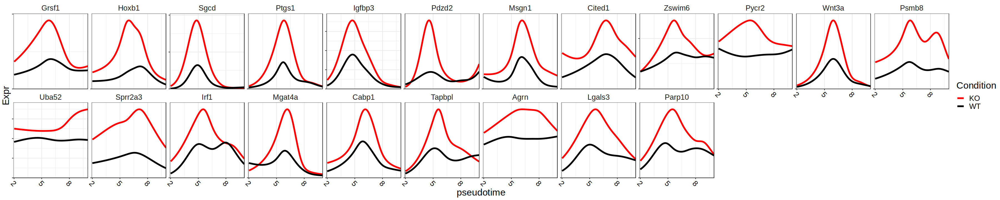

In [194]:
options(repr.plot.height=6, repr.plot.width=30)
plots[[1]]

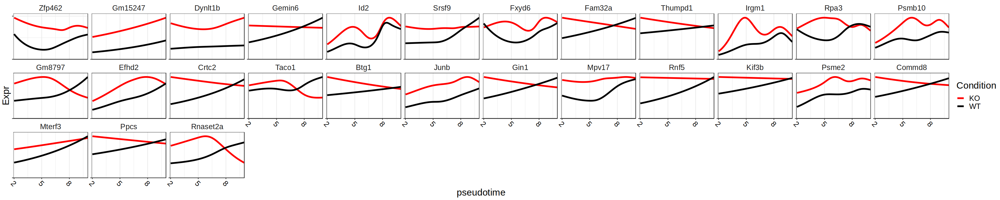

In [195]:
options(repr.plot.height=6, repr.plot.width=30)
plots[[2]]

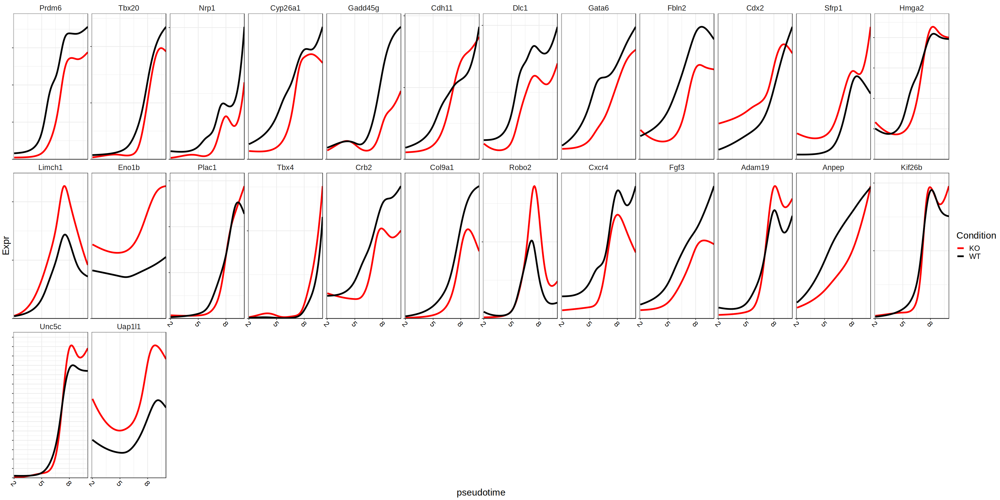

In [196]:
options(repr.plot.height=15, repr.plot.width=30)
plots[[3]]

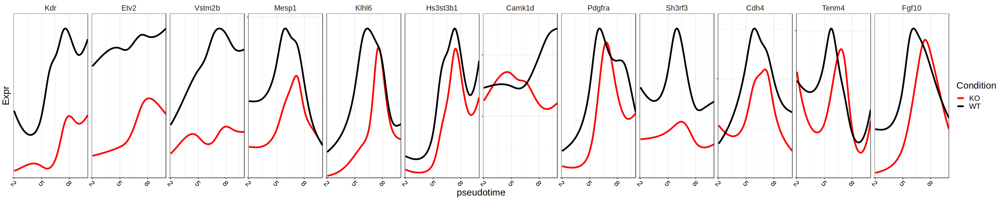

In [197]:
options(repr.plot.height=6, repr.plot.width=30)
plots[[4]]

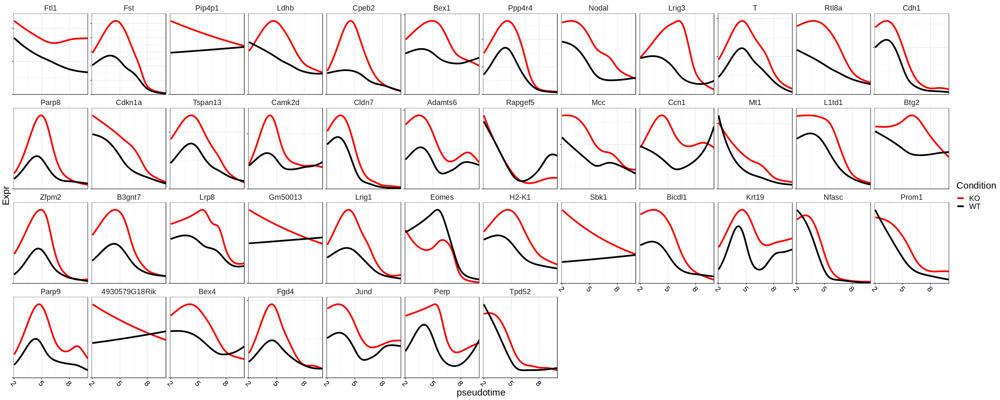

In [198]:
options(repr.plot.height=12, repr.plot.width=30)
plots[[5]]

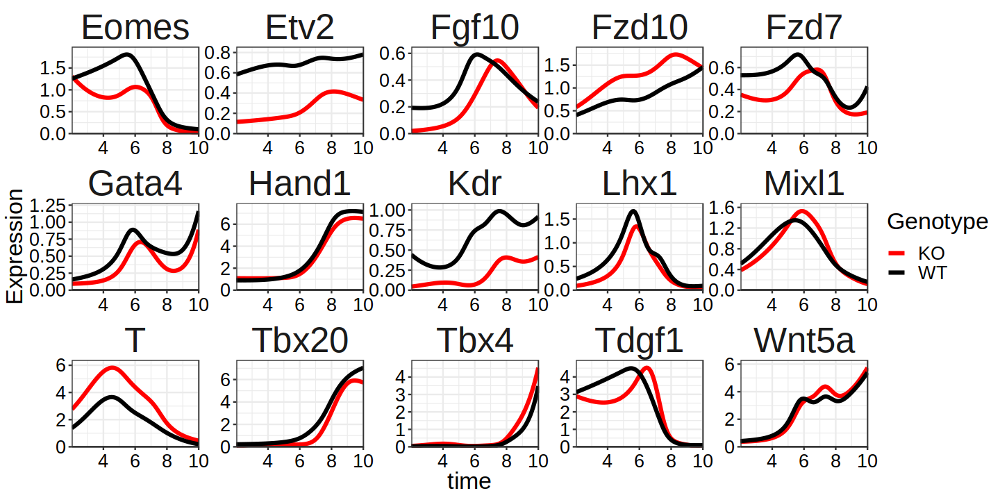

In [199]:
input_gene = c('Gata4', 'Etv2', 'Eomes', 'Kdr', 'Tbx20', 'Mixl1', 'Lhx1', 'Hand1', 'Tbx4', 'Fzd7', 'Fzd10', 'Fgf10', 'Tdgf1', 'Wnt5a', 'Fgf18', 'T')
input_gene = intersect(input_gene, rownames(sceGAM))
yhatSmooth <- as.data.table(predictSmooth(sceGAM, gene = input_gene, nPoints = 100, tidy = TRUE))
options(repr.plot.width = 12, repr.plot.height = 6)
ggplot(yhatSmooth, aes(time, yhat, color = condition)) + 
    geom_line(linewidth = 1.3) + 
    scale_color_manual(values=c('KO'='red', 'WT'='black'), name='Genotype') + 
    scale_x_continuous(expand=c(0.0001,0, 0.001, 0), breaks=c(seq(4, 50, 2))) + 
    scale_y_continuous(expand=c(0,0, 0.1, 0)) + 
    geom_hline(yintercept=0) +
    facet_wrap(~gene, ncol = 5, scales = 'free') + 
    ylab('Expression') + 
    theme_bw() + 
    theme(strip.background = element_blank(),
          text = element_text(size=20),
          strip.text = element_text(size = 30),
          plot.title = element_text(size = 30),
          axis.text = element_text(color='black'),
          axis.text.x = element_text(angle=0, hjust=0.5, vjust=0.5))

## ATAC analysis

In [100]:
# atac sce
args$peakmtx = file.path(io$basedir, 'processed/atac/archR/Matrices/PeakMatrix_summarized_experiment.rds')

In [111]:
######
#### Find variable peaks
######
# load RNA scGAM
sceGAM_RNA = readRDS(file.path(args$outdir, 'sceGAM_v2.rds'))

# load sce atac
atac.sce = readRDS(args$peakmtx)[, colnames(sceGAM_RNA)] # keep only cells from relevant trajectory
colData(atac.sce) = meta2[match(colnames(sceGAM_RNA), cell)] %>% as.data.frame() %>% tibble::column_to_rownames('cell') %>% DataFrame()
atac.sce = as(atac.sce, 'SingleCellExperiment')
assayNames(atac.sce) <- "counts"

# load mofa factors
mofa = fread(file.path(io$basedir, 'results/rna_atac/dimensionality_reduction/mofa/MOFA_factors.txt.gz')) %>% 
    .[match(colnames(atac.sce), cell),] %>% 
    as.data.frame() %>% tibble::column_to_rownames('cell') %>% 
    as.matrix

In [112]:
## First cluster cells at high resolution (replicating meta cells)
# Convert to Seurat
suppressPackageStartupMessages(library(Seurat))
seurat = CreateSeuratObject(counts = counts(atac.sce))
seurat[["mofa"]] <- CreateDimReducObject(embeddings = mofa, key = "mofa_", assay = DefaultAssay(seurat))

# First find high resolution clusters across the whole WT dataset
seurat <- FindNeighbors(seurat, reduction  = 'mofa')
seurat <- FindClusters(seurat, resolution = 1.5)
paste0('Number of Clusters: ', length(unique(Idents(seurat))))

# Pseudobulk ATAC by those clusters
atac.pb = aggregateAcrossCells(atac.sce, id=Idents(seurat), statistics="sum", use.assay.type="counts",  BPPARAM = BPPARAM)

# Normalise
assay(atac.pb,"logcounts") <- log(1e6*(sweep(assay(atac.pb),2,colSums(assay(atac.pb),na.rm=T),"/"))+1)

# Get HVGs
decomp <- modelGeneVar(atac.pb, BPPARAM = MulticoreParam(16)) # [expression$gene,]
decomp <- decomp[decomp$mean > 0.01,]
hvgs <- decomp[order(decomp$FDR),] %>% 
    as.data.table(., keep.rownames=T) 

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 7652
Number of edges: 236008

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7135
Number of communities: 15
Elapsed time: 0 seconds


Warning message:
“UNRELIABLE VALUE: One of the ‘future.apply’ iterations (‘future_lapply-1’) unexpectedly generated random numbers without declaring so. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'future.seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'future.seed = NULL', or set option 'future.rng.onMisuse' to "ignore".”


[1] "Number of Clusters: 15"

  |======================================================================| 100%



Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”


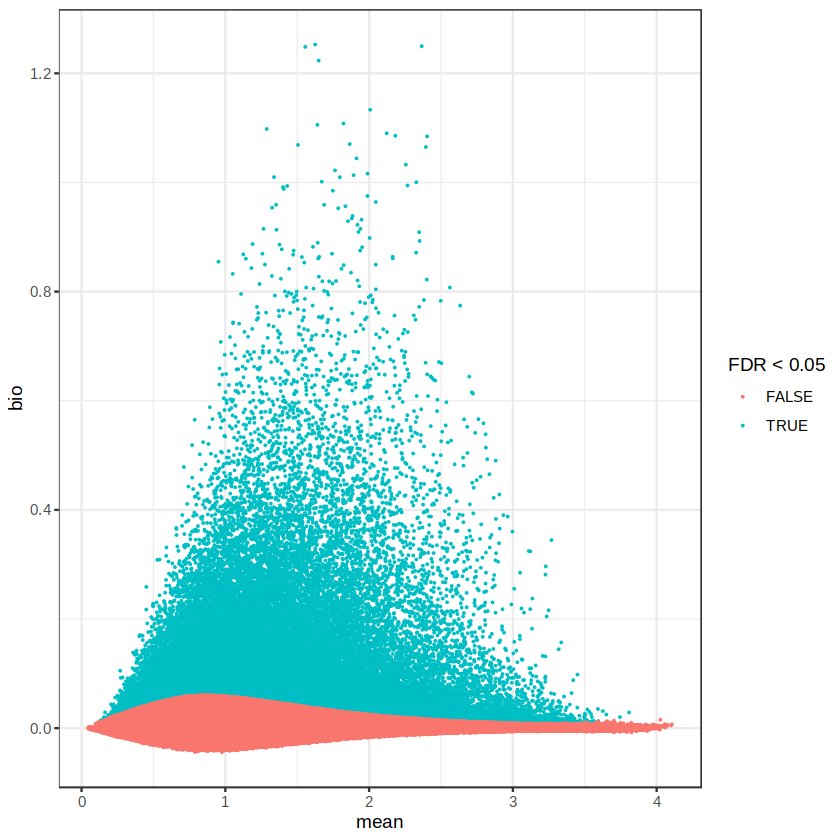

In [113]:
ggplot(hvgs, aes(mean, bio, color = FDR < 0.05)) + 
    geom_point(size = 0.02) + 
    theme_bw()

In [114]:
nrow(hvgs[FDR< 0.05])

[1] 43255

In [115]:
summary(colnames(atac.sce) == colnames(sceGAM))
summary(hvgs$rn %in% rownames(atac.sce))

   Mode    TRUE 
logical    7652 

   Mode    TRUE 
logical  234908 

In [116]:
# Get pseudotime and weights from RNA sceGAM (To make sure the exact same weights are used between modalities)
pseudotime = as.data.frame(sceGAM$crv[,c(1)])
weight = as.data.frame(sceGAM$crv[,c(2)])

# Export files to run as Rscript
R_script_list = list(cells = colnames(atac.sce),
                     peaks = rownames(atac.sce),
                     peak_stats = hvgs,
                     genotype = atac.sce$genotype,
                     replicate = atac.sce$replicate,
                     pseudotime = pseudotime,
                     weight = weight)

saveRDS(R_script_list, file.path(args$outdir, 'ATAC_tradeseq_objects_v2.rds'))

In [ ]:
# # #Following code ran as Rscript: 09_Eomes_invitro_blood/code/rna_atac/revisions/01_tradeSeq_ATAC_all_peaks.R
# here::i_am("revisions/04_TEomes_interaction/01_AllantoisTrajectory_KDvWT.ipynb")

# source(here::here("settings.R"))
# source(here::here("utils.R"))

# suppressPackageStartupMessages(library(scran))
# suppressPackageStartupMessages(library(scater))
# suppressPackageStartupMessages(library(Seurat))
# suppressPackageStartupMessages(library(dplyr))
# suppressPackageStartupMessages(library(edgeR))
# suppressPackageStartupMessages(library(destiny))
# suppressPackageStartupMessages(library(tradeSeq))
# suppressPackageStartupMessages(library(slingshot))
# suppressPackageStartupMessages(library(BiocParallel))

# BPPARAM <- BiocParallel::bpparam()
# BPPARAM$workers = 24

# # Multi core using future - built in to seurat
# plan("multicore", workers = 16)
# options(future.globals.maxSize = 50 * 1024 ^ 3) # for 50 Gb RAM
# set.seed(6)

# # I/O
# args = list()

# # atac sce
# args$peakmtx = file.path(io$basedir, 'processed/atac/archR/Matrices/PeakMatrix_summarized_experiment.rds')

# # outdir
# args$outdir = file.path(io$basedir, 'results/revisions/04_TEomes_interaction/')
# dir.create(args$outdir, recursive=TRUE, showWarnings =FALSE)

# print('Loading objects')
# R_script_list = readRDS(file.path(args$outdir, 'ATAC_tradeseq_objects_v2.rds'))

# print('loading peak mtx')
# peaks.sce = readRDS(args$peakmtx)[,R_script_list$cells]

# peaks.mtx = peaks.sce@assays@data$PeakMatrix
# rownames(peaks.mtx) = R_script_list$peaks
# colnames(peaks.mtx) = R_script_list$cells

# # Get model matrix
# U <- model.matrix(~R_script_list$replicate)

# print('Running fitGAM')
# sceGAM <- fitGAM(counts = peaks.mtx,
#               #   sds = rna.sce$slingshot,
#                  pseudotime = R_script_list$pseudotime,
#                  conditions = factor(R_script_list$genotype, levels = c('KO', 'WT')), # KD vs WT comparison
#                  cellWeights = R_script_list$weight, # All cells belong to the same trajectory                 
#                  U = U,
#                  nknots=8, 
#             #     genes = unique(R_script_list$peak_gene_correlation[padj<0.05][,1][[1]]), # Keep only peaks that are linked to the differential genes
#                  genes = R_script_list$peak_stats[FDR<0.05, rn],
#                  parallel = TRUE,
#                  BPPARAM=BPPARAM,
#                  verbose=T) 

# saveRDS(sceGAM, file.path(args$outdir, 'sceGAM_ATAC_all_peaks_v2.rds'))

[1] "Loading objects"
[1] "loading peak mtx"
[1] "Running fitGAM"


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 13.4 GiB”


  |==                                                                    |   3%

In [21]:
sceGAM = readRDS(file.path(args$outdir, 'sceGAM_ATAC_all_peaks_v2.rds'))

In [4]:
sceGAM

class: SingleCellExperiment 
dim: 43255 7652 
metadata(1): tradeSeq
assays(1): counts
rownames(43255): chr1:7020455-7021055 chr1:7671642-7672242 ...
  chr7:84247839-84248439 chr8:77544337-77544937
rowData names(1): tradeSeq
colnames(7652): 2_Eo_DEG_G9_day3_5_VC#AAACATGCAAGCGATG-1
  2_Eo_DEG_G9_day3_5_VC#AAACCAACACCCACAG-1 ...
  rv_eo_deg_day4_dtag#TTTGTCTAGTTAGTGC-1
  rv_eo_deg_day4_dtag#TTTGTGGCACAAAGAC-1
colData names(2): crv tradeSeq
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):

In [5]:
# Test if l2fc should be changed around? 
condRes <- conditionTest(sceGAM, l2fc = 0)
condRes$padj <- p.adjust(condRes$pvalue, "fdr")

In [6]:
condRes = condRes %>% as.data.table(keep.rownames=T) %>%
    setnames('rn', 'gene') %>%
    .[,sig:=ifelse(padj<=0.05, TRUE, FALSE)] %>%
    .[order(padj, -waldStat)]

In [7]:
fwrite(condRes, file.path(args$outdir, 'condRes_ATAC_v2.txt.gz'))

In [144]:
condRes = fread(file.path(args$outdir, 'condRes_ATAC_v2.txt.gz'))

In [45]:
nrow(condRes[sig == T])

[1] 7040

In [46]:
yhatSmooth <- as.data.table(predictSmooth(sceGAM, gene = condRes[sig == T, gene], nPoints = 100, tidy=TRUE))

In [47]:
genes_keep = condRes[sig==T, gene]
genes_label = NULL #condRes[sig==T, gene]

trans <- div_gradient_pal(low='#5a77ff', mid='lightyellow', high='#d66468')

cols <- trans(seq(0,1, length.out=20))
# col_fun = colorRamp2(seq(0, 100, 5), viridis::viridis(length(seq(0, 100, 5))))
col_fun = colorRamp2(seq(0, 100, 5), colorRampPalette(c("darkblue", "orange", "purple", 'darkorchid4'))(length(seq(0, 100, 5))))

ha = HeatmapAnnotation(pseudotime = 1:100,
                       col = list(pseudotime = col_fun))

yhatSmooth <- predictSmooth(sceGAM, gene = genes_keep, nPoints = 100, tidy = FALSE)

# minmax normalisation 
minmax = function(x){(x-min(x))/(max(x)-min(x))}
yhatSmooth_minmax = t(apply(yhatSmooth, 1, minmax)) 

WT = yhatSmooth_minmax[, grepl('lineage1_conditionWT', colnames(yhatSmooth_minmax))]
KO = yhatSmooth_minmax[, grepl('lineage1_conditionKO', colnames(yhatSmooth_minmax))]

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.



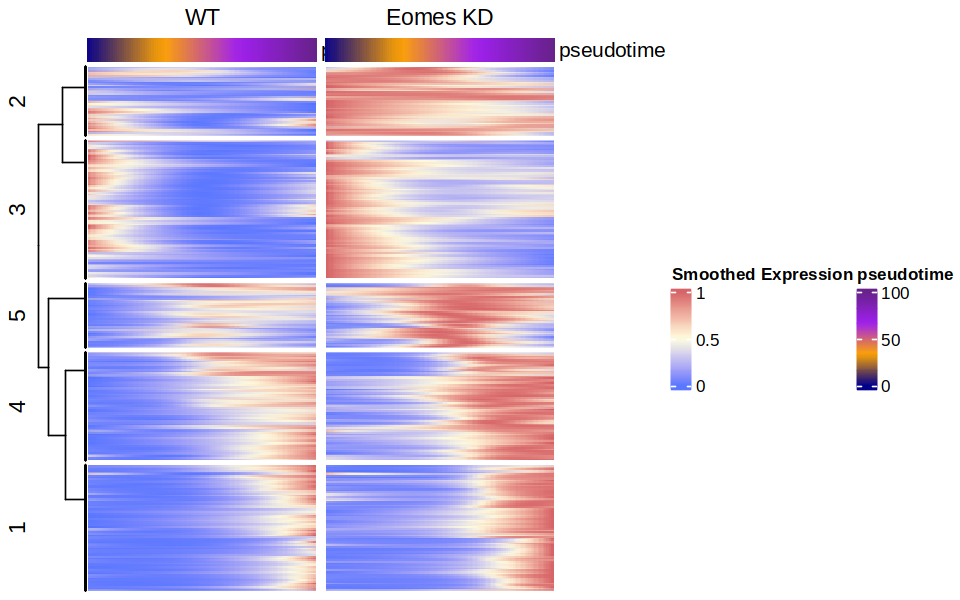

In [48]:
# Clustering
set.seed(42)
k = 5
group = kmeans(yhatSmooth_minmax, centers = k)$cluster
row_clust = cluster_within_group(t(yhatSmooth_minmax), group)

ra = rowAnnotation(foo = anno_mark(at = match(genes_label, rownames(WT)), labels = genes_label))


hm_list = Heatmap(WT, 
                  cluster_rows = row_clust,
                  cluster_columns = FALSE,
                  column_title = 'WT',
                  show_column_names  = FALSE,
                  row_split = k,
                  #row_split = as.data.frame(group), 
                  #km = 6,
                  col = cols,
                  heatmap_legend_param = list(title = 'Smoothed Expression'), 
                  top_annotation = ha) + 
          Heatmap(KO, 
                  cluster_columns = FALSE, 
                  column_title = 'Eomes KD',
                  show_column_names  = FALSE,
                  show_row_names  = FALSE,
                  col = cols,
                  show_heatmap_legend = F, 
                  top_annotation = ha,
                  right_annotation = ra)

options(repr.plot.height=5, repr.plot.width=8)
draw(hm_list)

In [50]:
group.dt = as.data.table(group, keep.rownames = T) %>% setnames('rn', 'region')
fwrite(group.dt, file.path(args$outdir, 'atac_groups.txt.gz'))

In [27]:
# matches <- getMatches(ArchRProject, 'Motif_cisbp')
# rownames(matches) = rownames(atac.sce)

io$multiome = '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/multiome_atlas/'
silico_chip = readRDS(file.path(io$multiome, 'vitro_peaks_silicoChIP_cisbp.rds'))
assay(silico_chip, 'matches') = assay(silico_chip, 'VirtualChipScores') > 0.2 # keep only motifs with in silico score > 0.2
assay(silico_chip, 'motifScores') = NULL
assay(silico_chip, 'motifMatches') = NULL
assay(silico_chip, 'motifCounts') = NULL
assay(silico_chip, 'VirtualChipScores') = NULL
matches = silico_chip


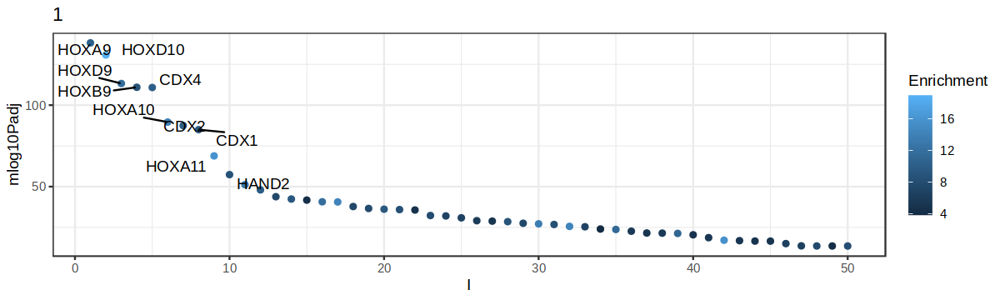

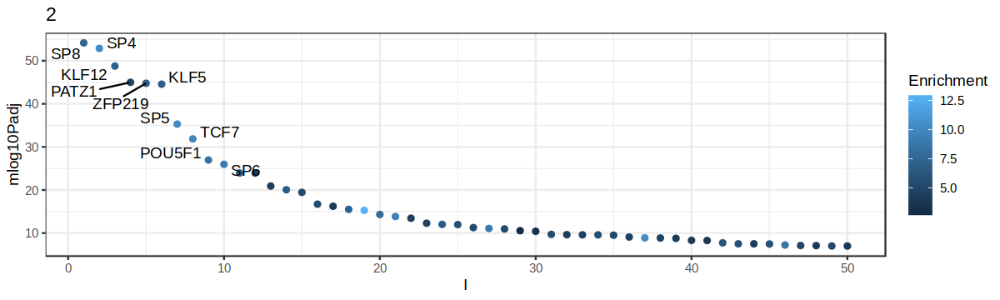

Warning message:
“ggrepel: 4 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


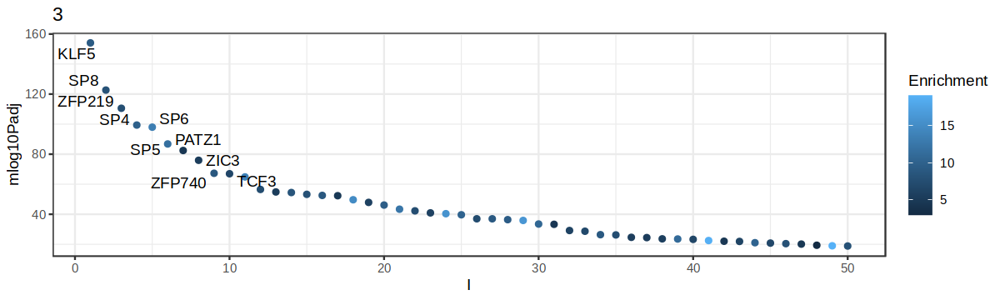

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]


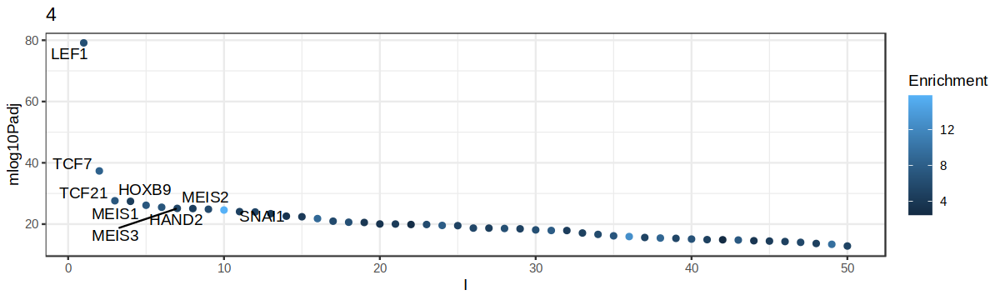

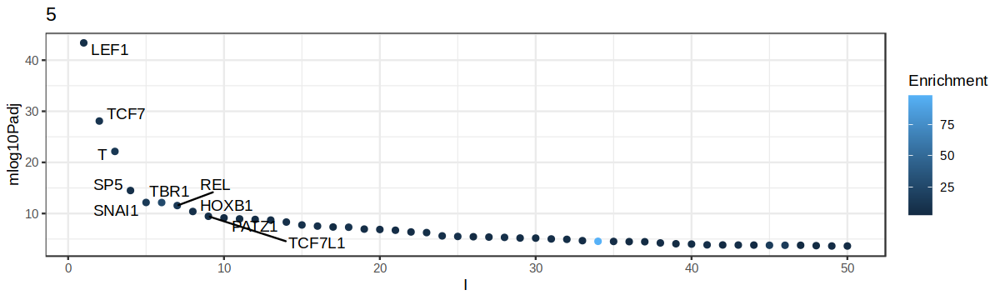

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 3)

lapply(1:5, function(x){
    genes = names(group)[group == x]
    tmp2 = as.data.table(ArchR:::.computeEnrichment(matches, genes, seq_len(nrow(matches)))) %>%
            .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
            .[mlog10Padj > -log10(0.05)]

    to.plot = tmp2[order(-mlog10Padj)] %>% .[,I := .I]
    ggplot(head(to.plot, 50), aes(I, mlog10Padj, color = Enrichment)) + 
        geom_point() + 
        ggrepel::geom_text_repel(data = head(to.plot,10), aes(label = feature), color = 'black') + 
        ggtitle(x) + 
        theme_bw()
})


### BrowserPlot

In [331]:
args$vitro_bws = file.path(io$basedir, 'processed/atac/archR/GroupBigWigs/celltypeV2_genotype/')

bigwigs.data_vitro = data.table(celltype = list.files(args$vitro_bws, 'bw') %>% str_split(., '\\.') %>% map_chr(1),
                    genotype = list.files(args$vitro_bws, 'bw') %>% str_split(., '\\.') %>% map_chr(2) %>% str_split('-') %>% map_chr(1),
                    path =  paste0(args$vitro_bws, list.files(args$vitro_bws, 'bw'))) %>% 
                .[,name := gsub('KO', 'KD', paste0(celltype, ' ', genotype))] %>% 
                .[,color := ifelse(genotype == 'KO', '#FF0000', '#000000')]

In [332]:
WT_plot$name

[1] .       Eomes ChIP     .        T ChIP        Primitive_Streak KD   
 [4] Primitive_Streak WT    Early_Mes_EOi KD       Early_Mes_EOi WT      
 [7] Posterior_Mes KD       Posterior_Mes WT       Allantois_Precursor KD
[10] Allantois_Precursor WT
10 Levels: .        T ChIP .       Eomes ChIP ... Primitive_Streak WT

In [333]:
chips = data.table(
    celltype = 'ChIP',
    genotype = '',
    path = c('/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/ChIP/Eomes/GSE128466/GSE128466_bamCoverage_ChIP_EoGFP_dox.bigwig',
            '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/ChIP/Eomes/GSE128466/GSE128466_bamCoverage_ChIP_BraGFP_dox.bigwig'),
    name = c('.       Eomes ChIP', '.        T ChIP'),
    color = c('darkgreen', 'darkblue')
)

In [334]:
chips

celltype,genotype,path,name,color
<chr>,<chr>,<chr>,<chr>,<chr>
ChIP,,/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/ChIP/Eomes/GSE128466/GSE128466_bamCoverage_ChIP_EoGFP_dox.bigwig,. Eomes ChIP,darkgreen
ChIP,,/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/ChIP/Eomes/GSE128466/GSE128466_bamCoverage_ChIP_BraGFP_dox.bigwig,. T ChIP,darkblue


In [335]:
bigwigs.data = rbind(bigwigs.data_vitro, chips)

In [336]:
unique(bigwigs.data$celltype)

[1] "Allantois_Precursor" "Allantois"           "Blood_Progenitor"   
 [4] "Early_Mes_EOd"       "Early_Mes_EOi"       "Endothelium"        
 [7] "HE_Precursor"        "HE"                  "Mesenchyme"         
[10] "PGC"                 "Posterior_Mes"       "Primitive_Streak"   
[13] "ChIP"

In [337]:
celltypes = c('ChIP', 'Primitive_Streak', 'Early_Mes_EOi', 'Posterior_Mes', 'Allantois_Precursor')

WT_plot = bigwigs.data %>% copy() %>%
    .[celltype %in% celltypes] %>%
    .[, celltype := factor(celltype, levels = celltypes)] %>%
    .[order(celltype)] %>% 
    .[, name := as.factor(name)]

In [338]:
head(WT_plot)

celltype,genotype,path,name,color
<fct>,<chr>,<chr>,<fct>,<chr>
ChIP,,/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/ChIP/Eomes/GSE128466/GSE128466_bamCoverage_ChIP_EoGFP_dox.bigwig,. Eomes ChIP,darkgreen
ChIP,,/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/ChIP/Eomes/GSE128466/GSE128466_bamCoverage_ChIP_BraGFP_dox.bigwig,. T ChIP,darkblue
Primitive_Streak,KO,/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/Primitive_Streak.KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw,Primitive_Streak KD,#FF0000
Primitive_Streak,WT,/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/Primitive_Streak.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw,Primitive_Streak WT,#000000
Early_Mes_EOi,KO,/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/Early_Mes_EOi.KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw,Early_Mes_EOi KD,#FF0000
Early_Mes_EOi,WT,/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/Early_Mes_EOi.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw,Early_Mes_EOi WT,#000000


In [339]:
ArchRProject = loadArchRProject(io$archR.directory)

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

In [340]:
nrow(WT_plot)

[1] 10

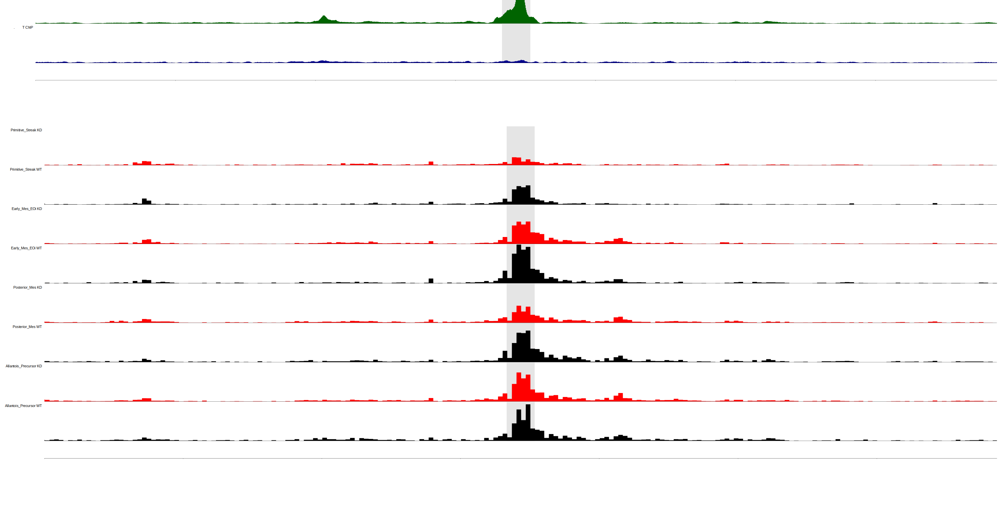

In [341]:
input_region = condRes[1, gene]
extend = 1e4
options(repr.plot.width = 25, repr.plot.height = 13)
ggarrange(plot_browser_track(gene = NULL, # gene used for plotting expression
                              input_region = input_region, # Region used
                              bigwigs = WT_plot[1:2], 
                              extend.upstream = extend,
                              extend.downstream = extend, 
                              highlight_regions = input_region, #if(length(tmp1$peak)>0){tmp1$peak}else{NULL},
                              downsample.rate = 1, 
                              no_label = F, 
                              plot_expression = F,
                              background_color = 'white',
                              highlight_color = 'grey90',
                              bw_height = 25, 
                              gene_height = 10,
                              bw_width = 200,
                              expr_width = 0),

plot_browser_track(gene = NULL, # gene used for plotting expression
                              input_region = input_region, # Region used
                              bigwigs = WT_plot[3:10], 
                              extend.upstream = extend,
                              extend.downstream = extend, 
                              highlight_regions = input_region, #if(length(tmp1$peak)>0){tmp1$peak}else{NULL},
                              downsample.rate = 1, 
                              no_label = F, 
                              plot_expression = F,
                              background_color = 'white',
                              highlight_color = 'grey90',
                              bw_height = 25, 
                              gene_height = 10,
                              bw_width = 200,
                              expr_width = 0),
          ncol = 1, 
          heights = c(1, 7)
)

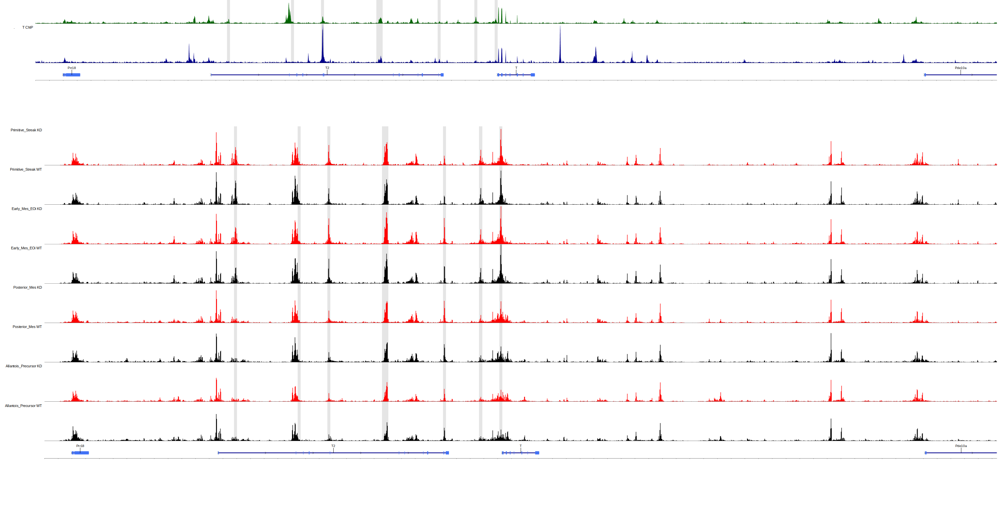

In [347]:
input_region = condRes[sig == T, gene]
extend = 1e5
options(repr.plot.width = 25, repr.plot.height = 13)
ggarrange(plot_browser_track(gene = 'T', # gene used for plotting expression
                              input_region = NULL, # Region used
                              bigwigs = WT_plot[1:2], 
                              extend.upstream = extend,
                              extend.downstream = extend, 
                              highlight_regions = input_region, #if(length(tmp1$peak)>0){tmp1$peak}else{NULL},
                              downsample.rate = 1, 
                              no_label = F, 
                              plot_expression = F,
                              background_color = 'white',
                              highlight_color = 'grey90',
                              bw_height = 25, 
                              gene_height = 10,
                              bw_width = 200,
                              expr_width = 0),

plot_browser_track(gene = 'T', # gene used for plotting expression
                              input_region = NULL, # Region used
                              bigwigs = WT_plot[3:10], 
                              extend.upstream = extend,
                              extend.downstream = extend, 
                              highlight_regions = input_region, #if(length(tmp1$peak)>0){tmp1$peak}else{NULL},
                              downsample.rate = 1, 
                              no_label = F, 
                              plot_expression = F,
                              background_color = 'white',
                              highlight_color = 'grey90',
                              bw_height = 25, 
                              gene_height = 10,
                              bw_width = 200,
                              expr_width = 0),
          ncol = 1, 
          heights = c(1, 7)
)

In [380]:
args$WT_trajectory = file.path(io$basedir, 'results/rna_atac/trajectory/v3')
peak_gene_correlation = fread(file.path(args$WT_trajectory, 'acc_gene_correlation.txt.gz'))

In [381]:
test = merge(condRes[sig == T] %>% setnames('gene', 'peak'), 
             peak_gene_correlation %>% setnames('padj', 'padj_linkage'), by = 'peak')

In [382]:
tmp = test[peak %in% names(group)[group == 5]]

In [383]:
test[gene == 'T']

peak,waldStat,df,pvalue,padj,sig,cor,pval,distance,gene,padj_linkage
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
chr17:8375882-8376482,32.29819,7,3.575815e-05,9.250709e-04,TRUE,0.913,3.038203e-09,58241,T,2.288349e-06
chr17:8389748-8390348,20.15536,2,4.200668e-05,1.044736e-03,TRUE,0.932,2.781335e-10,44375,T,4.757687e-07
chr17:8396231-8396831,52.27433,7,5.154966e-09,1.087698e-06,TRUE,0.846,7.169728e-07,37892,T,9.275343e-05
chr17:8408226-8408826,31.73919,6,1.830733e-05,5.510673e-04,TRUE,0.838,1.104497e-06,25897,T,1.246982e-04
chr17:8408909-8409509,39.53521,5,1.852905e-07,1.727314e-05,TRUE,0.902,1.012208e-08,25214,T,5.183969e-06
chr17:8421488-8422088,24.01442,7,1.132721e-03,1.226737e-02,TRUE,-0.007,9.756534e-01,12635,T,9.889425e-01
chr17:8429414-8430014,12.53686,2,1.895198e-03,1.773984e-02,TRUE,0.937,1.371341e-10,4709,T,3.026097e-07
chr17:8433824-8434424,45.02699,7,1.351203e-07,1.356063e-05,TRUE,0.964,5.340093e-13,299,T,1.138402e-08


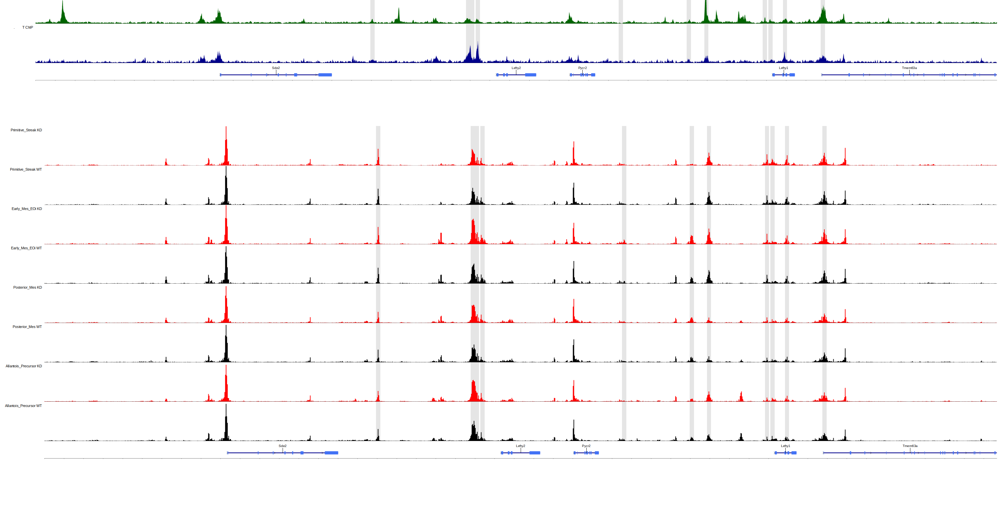

In [390]:
input_region = condRes[sig == T, gene]
extend = 7e4
options(repr.plot.width = 25, repr.plot.height = 13)
ggarrange(plot_browser_track(gene = 'Lefty2', # gene used for plotting expression
                              input_region = NULL, # Region used
                              bigwigs = WT_plot[1:2], 
                              extend.upstream = extend,
                              extend.downstream = extend, 
                              highlight_regions = input_region, #if(length(tmp1$peak)>0){tmp1$peak}else{NULL},
                              downsample.rate = 1, 
                              no_label = F, 
                              plot_expression = F,
                              background_color = 'white',
                              highlight_color = 'grey90',
                              bw_height = 25, 
                              gene_height = 10,
                              bw_width = 200,
                              expr_width = 0),

plot_browser_track(gene = 'Lefty2', # gene used for plotting expression
                              input_region = NULL, # Region used
                              bigwigs = WT_plot[3:10], 
                              extend.upstream = extend,
                              extend.downstream = extend, 
                              highlight_regions = input_region, #if(length(tmp1$peak)>0){tmp1$peak}else{NULL},
                              downsample.rate = 1, 
                              no_label = F, 
                              plot_expression = F,
                              background_color = 'white',
                              highlight_color = 'grey90',
                              bw_height = 25, 
                              gene_height = 10,
                              bw_width = 200,
                              expr_width = 0),
          ncol = 1, 
          heights = c(1, 7)
)

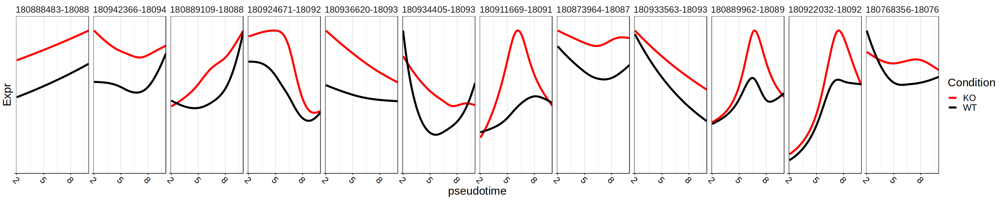

In [395]:
# Maybe just plot with predictSmooth values since they don't go below 0 so look a bit nicer
genes = test[gene == 'Lefty2' & sig == T, ] %>%
    .[order(peak)] %>% .$peak

yhatSmooth <- predictSmooth(sceGAM, gene = genes, nPoints = 100, tidy=TRUE)

RNA_filt.dt = as.data.table(yhatSmooth[yhatSmooth$gene %in% genes,]) %>% 
        setnames(c('lineage', 'time', 'yhat'), c('Traj', 'pseudotime', 'Expr')) %>%
        .[,gene:=factor(gene, levels = genes_keep)] %>%
        .[,Traj:=as.character(Traj)]

p = ggplot(RNA_filt.dt, aes(pseudotime, Expr, color=condition)) + 
    #    geom_point(size=0.2, alpha=0.2) +
        geom_line(linewidth = 1.3) + 
        scale_color_manual(values=c('KO'='red', 'WT'='black'), name='Condition') + 
        scale_x_continuous(expand=c(0.01,0, 0, 0), breaks=c(seq(2, 50, 3))) + 
        scale_y_continuous(expand=c(0,0, 0.1, 0), breaks=seq(0, 1e3, 3)) + 
    #    geom_smooth(se = F) +
        geom_hline(yintercept=0) +
        facet_wrap(~gene, ncol=12, scales='free_y') + 
        theme_bw() + 
        theme(strip.background = element_blank(),
              text = element_text(size=20),
              axis.text = element_text(color='black'),
              axis.text.x = element_text(angle=-45, hjust=0, vjust=1),
              axis.text.y = element_blank())

options(repr.plot.width = 25, repr.plot.height = 5)
p

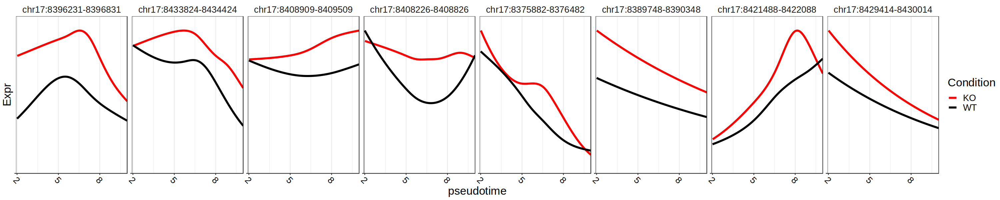

In [396]:
# Maybe just plot with predictSmooth values since they don't go below 0 so look a bit nicer
genes = test[gene == 'T' & sig == T, ] %>%
    .[order(peak)] %>% .$peak

yhatSmooth <- predictSmooth(sceGAM, gene = genes, nPoints = 100, tidy=TRUE)

RNA_filt.dt = as.data.table(yhatSmooth[yhatSmooth$gene %in% genes,]) %>% 
        setnames(c('lineage', 'time', 'yhat'), c('Traj', 'pseudotime', 'Expr')) %>%
        .[,gene:=factor(gene, levels = genes_keep)] %>%
        .[,Traj:=as.character(Traj)]

p = ggplot(RNA_filt.dt, aes(pseudotime, Expr, color=condition)) + 
    #    geom_point(size=0.2, alpha=0.2) +
        geom_line(linewidth = 1.3) + 
        scale_color_manual(values=c('KO'='red', 'WT'='black'), name='Condition') + 
        scale_x_continuous(expand=c(0.01,0, 0, 0), breaks=c(seq(2, 50, 3))) + 
        scale_y_continuous(expand=c(0,0, 0.1, 0), breaks=seq(0, 1e3, 3)) + 
    #    geom_smooth(se = F) +
        geom_hline(yintercept=0) +
        facet_wrap(~gene, ncol=12, scales='free_y') + 
        theme_bw() + 
        theme(strip.background = element_blank(),
              text = element_text(size=20),
              axis.text = element_text(color='black'),
              axis.text.x = element_text(angle=-45, hjust=0, vjust=1),
              axis.text.y = element_blank())

options(repr.plot.width = 25, repr.plot.height = 5)
p

peak,waldStat,df,pvalue,padj,sig,cor,pval,distance,gene,padj_linkage
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
chr11:85759907-85760507,10.37332,2,5.590648e-03,0.0383299252,TRUE,0.504,1.678224e-02,129856,Tbx4,8.576535e-02
chr11:85771404-85772004,11.84493,2,2.678590e-03,0.0227739591,TRUE,-0.721,1.522493e-04,118359,Tbx4,3.624476e-03
chr11:85774656-85775256,22.91991,5,3.496763e-04,0.0051272027,TRUE,-0.066,7.688435e-01,115107,Tbx4,8.818976e-01
chr11:85776233-85776833,17.47230,6,7.695559e-03,0.0480154719,TRUE,0.512,1.485481e-02,113530,Tbx4,7.909985e-02
chr11:85800360-85800960,15.15870,2,5.108920e-04,0.0067804877,TRUE,0.535,1.036580e-02,89403,Tbx4,6.235640e-02
chr11:85804037-85804637,34.55091,7,1.358104e-05,0.0004387214,TRUE,0.366,9.436137e-02,85726,Tbx4,2.611846e-01
chr11:85818158-85818758,22.38605,6,1.030469e-03,0.0114377526,TRUE,0.257,2.480775e-01,71605,Tbx4,4.718409e-01
chr11:85832337-85832937,23.57470,8,2.699686e-03,0.0228920066,TRUE,0.310,1.606522e-01,57426,Tbx4,3.630032e-01
chr11:85915861-85916461,15.28952,3,1.585225e-03,0.0156812248,TRUE,0.891,2.735991e-08,64,Tbx4,1.017524e-05


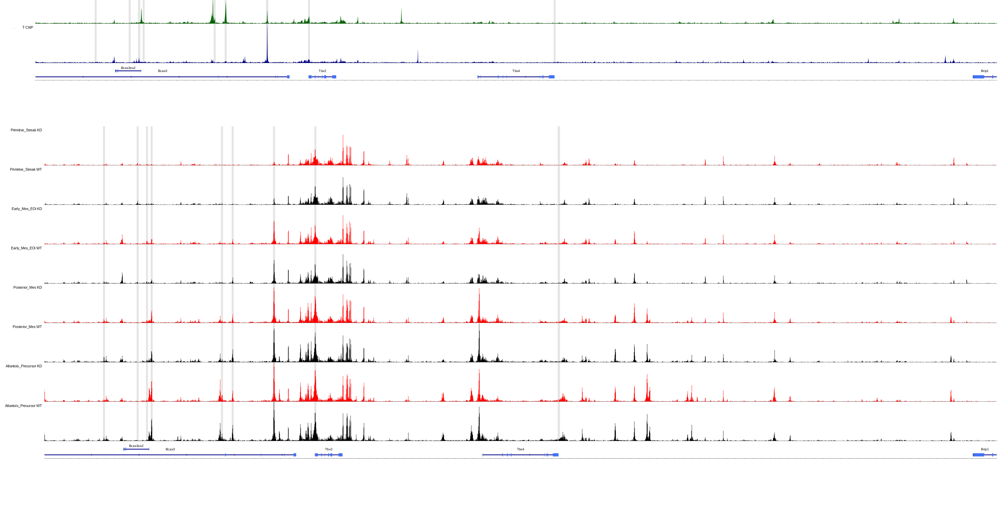

In [399]:
input_region = condRes[sig == T, gene]
gene = 'Tbx4'
extend = max(test[gene == gene, distance]) 
options(repr.plot.width = 25, repr.plot.height = 13)
ggarrange(plot_browser_track(gene = gene, # gene used for plotting expression
                              input_region = NULL, # Region used
                              bigwigs = WT_plot[1:2], 
                              extend.upstream = extend,
                              extend.downstream = extend, 
                              highlight_regions = input_region, #if(length(tmp1$peak)>0){tmp1$peak}else{NULL},
                              downsample.rate = 1, 
                              no_label = F, 
                              plot_expression = F,
                              background_color = 'white',
                              highlight_color = 'grey90',
                              bw_height = 25, 
                              gene_height = 10,
                              bw_width = 200,
                              expr_width = 0),

plot_browser_track(gene = gene, # gene used for plotting expression
                              input_region = NULL, # Region used
                              bigwigs = WT_plot[3:10], 
                              extend.upstream = extend,
                              extend.downstream = extend, 
                              highlight_regions = input_region, #if(length(tmp1$peak)>0){tmp1$peak}else{NULL},
                              downsample.rate = 1, 
                              no_label = F, 
                              plot_expression = F,
                              background_color = 'white',
                              highlight_color = 'grey90',
                              bw_height = 25, 
                              gene_height = 10,
                              bw_width = 200,
                              expr_width = 0),
          ncol = 1, 
          heights = c(1, 7)
)

### Plot heatmaps of Eomes & T ChIP signal surrounding differential peaks

In [28]:
chips = data.table(
    celltype = 'ChIP',
    genotype = '',
    path = c('/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/ChIP/Eomes/GSE128466/GSE128466_bamCoverage_ChIP_EoGFP_dox.bigwig',
            '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/ChIP/Eomes/GSE128466/GSE128466_bamCoverage_ChIP_BraGFP_dox.bigwig',
            '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/ChIP/Eomes/GSE128466/GSE128466_bamCoverage_ChIP_EoGFP_nodox.bigwig',
            '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/ChIP/Eomes/GSE128466/GSE128466_bamCoverage_ChIP_BraGFP_nodox.bigwig'),
    name = c('Eomes ChIP', 'T ChIP', 'Eomes Ctrl', 'T Ctrl'),
    color = c('darkgreen', 'darkblue', 'grey90', 'grey95')
)
group.dt = as.data.table(group, keep.rownames = T) %>% setnames('rn', 'region')


In [29]:
input_region= rownames(WT)

order = input_region[unlist(row_order(hm_list))]

extend = 1000 # 1000
outlier = 0.98 # 0.95

gr <- GRanges(c(str_split(input_region, ":") %>% map_chr(1)), 
    IRanges(start = as.numeric(str_split(str_split(input_region, 
                        ":") %>% map_chr(2), "-") %>% map_chr(1)) - extend, 
            end = as.numeric(str_split(str_split(input_region, 
                      ":") %>% map_chr(2), "-") %>% map_chr(2)) +  extend), strand = "+")

gr

Warning message:
“The heatmap list has not been initialized. You might have different
results if you repeatedly execute this function, e.g. when
row_km/column_km was set. It is more suggested to do as `ht_list =
draw(ht_list); row_order(ht_list)`.”


GRanges object with 7040 ranges and 0 metadata columns:
         seqnames              ranges strand
            <Rle>           <IRanges>  <Rle>
     [1]     chr9   46912091-46914691      +
     [2]     chr1 180887483-180890083      +
     [3]    chr14   63358208-63360808      +
     [4]    chr14 121778637-121781237      +
     [5]    chr14   23901737-23904337      +
     ...      ...                 ...    ...
  [7036]    chr19   37994436-37997036      +
  [7037]     chr4 141336801-141339401      +
  [7038]     chr7 141147478-141150078      +
  [7039]     chr2 165200621-165203221      +
  [7040]     chr4 156062749-156065349      +
  -------
  seqinfo: 20 sequences from an unspecified genome; no seqlengths

In [30]:
plot_bigwig = function(file, background = NULL, rollmean = NULL, outlier = 0.98){
    bigwig = mclapply(input_region, function(x){
        input_region = x
        gr <- GRanges(c(str_split(input_region, ":") %>% map_chr(1)), 
        IRanges(start = as.numeric(str_split(str_split(input_region, 
                            ":") %>% map_chr(2), "-") %>% map_chr(1)) - extend, 
                end = as.numeric(str_split(str_split(input_region, 
                          ":") %>% map_chr(2), "-") %>% map_chr(2)) +  extend), strand = "+")

        tmp = as.data.table(rtracklayer::import.bw(con = file, which = gr, as = "NumericList")) %>%
            .[, combine := ((.I - 1) %/% 10) + 1] %>%
            .[, .(mean_value = mean(value)), 
                  by = combine] %>%
            .[, pos := (combine-nrow(.)/2 ) * 10] %>%
            .[, region := x] 
        
        if(!is.null(rollmean)){
            tmp = tmp[, rollingmean := frollmean(mean_value, n = rollmean, align = "center")] %>%
                    .[, rollingmean := fifelse(is.na(rollingmean), mean_value, rollingmean)] %>% 
                .[,mean_value := rollingmean] %>% .[, rollingmean := NULL]
        }
        
        if(!is.null(background)){
            bg = as.data.table(rtracklayer::import.bw(con = background, which = gr, as = "NumericList")) %>%
                .[, combine := ((.I - 1) %/% 10) + 1] %>%
                .[, .(mean_value_bg = mean(value)), 
                      by = combine] %>%
                .[, pos := (combine-nrow(.)/2 ) * 10] %>%
                .[, region := x]
            if(!is.null(rollmean)){
                bg = bg[, rollingmean := frollmean(mean_value_bg, n = rollmean, align = "center")] %>%
                    .[, rollingmean := fifelse(is.na(rollingmean), mean_value_bg, rollingmean)] %>% 
                    .[,mean_value_bg := rollingmean] %>% .[, rollingmean := NULL]
            }
            tmp = merge(tmp, bg, by = c('region', 'pos')) %>%
                .[, mean_value := mean_value - mean_value_bg]
        }
        return(tmp)
    }, mc.cores = 40) %>%
        rbindlist()

    bigwig = merge(bigwig, group.dt, by = 'region')
    bigwig = bigwig[,group := factor(group, levels = c(2,3,5,4,1))]
    bigwig = bigwig[,region := factor(region, levels = order)]
    bigwig = bigwig %>%
        .[,value_no_outlier := ifelse(mean_value > quantile(mean_value, outlier, na.rm = T), quantile(mean_value, outlier, na.rm = T), mean_value)] %>% 
        .[,value_no_outlier := ifelse(value_no_outlier < quantile(value_no_outlier, 1-outlier, na.rm = T), quantile(value_no_outlier, 1-outlier, na.rm = T), value_no_outlier)]
    
    
    p = ggplot(bigwig, aes(pos, region, fill = minmax(value_no_outlier))) + 
        geom_tile() +
         viridis::scale_fill_viridis() +#limits = c(0, max(bigwig$value_no_outlier))) + 
        #scale_fill_gradientn(colors = rev(rainbow(4)), values = c(0, 0.2, 0.5, 1)) + 
        scale_x_continuous(expand = c(0,0)) + 
        scale_y_discrete(expand = c(0,0)) + 
        xlab('distance to centre (bp)') +
        facet_grid(group ~ ., scales = 'free_y', space = 'free_y') + 
        theme_bw() + 
        theme(axis.text = element_text(color = 'black'),
              axis.text.y = element_blank(),
              axis.title.y = element_blank(),
              axis.ticks.y = element_blank(),
              strip.background = element_blank(),
              strip.text = element_blank())
    return(p)
}

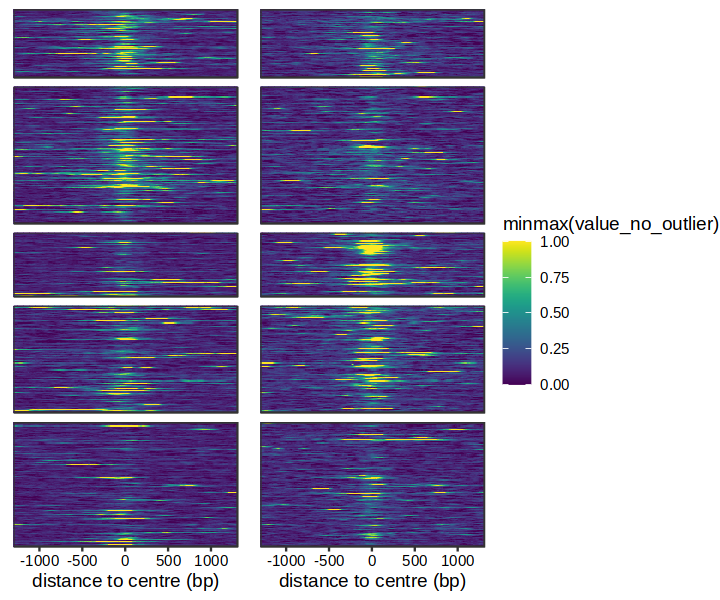

In [31]:
p1 = plot_bigwig(chips$path[1], chips$path[3])
p2 = plot_bigwig(chips$path[2], chips$path[4])
options(repr.plot.height=5, repr.plot.width=6)
ggarrange(p1, p2, common.legend = T, legend = 'right')

In [136]:
T_bed = fread('/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/ChIP/Eomes/GSE128466/GSE128466_Peaks_ChIP_BraGFP_pileup40.bed.gz') %>%
    setnames(c('chr', 'start','end', 'name'))
Eomes_bed = fread('/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/ChIP/Eomes/GSE128466/GSE128466_Peaks_ChIP_EoGFP_pileup120.bed.gz') %>%
    setnames(c('chr', 'start','end', 'name'))

In [137]:
Eomes_gr = makeGRangesFromDataFrame(Eomes_bed)
T_gr = makeGRangesFromDataFrame(T_bed)

In [138]:
input_region= rownames(WT)
gr <- GRanges(c(str_split(input_region, ":") %>% map_chr(1)), 
    IRanges(start = as.numeric(str_split(str_split(input_region, 
                        ":") %>% map_chr(2), "-") %>% map_chr(1)), 
            end = as.numeric(str_split(str_split(input_region, 
                      ":") %>% map_chr(2), "-") %>% map_chr(2))), strand = "+")

gr

GRanges object with 7040 ranges and 0 metadata columns:
         seqnames              ranges strand
            <Rle>           <IRanges>  <Rle>
     [1]     chr9   46913091-46913691      +
     [2]     chr1 180888483-180889083      +
     [3]    chr14   63359208-63359808      +
     [4]    chr14 121779637-121780237      +
     [5]    chr14   23902737-23903337      +
     ...      ...                 ...    ...
  [7036]    chr19   37995436-37996036      +
  [7037]     chr4 141337801-141338401      +
  [7038]     chr7 141148478-141149078      +
  [7039]     chr2 165201621-165202221      +
  [7040]     chr4 156063749-156064349      +
  -------
  seqinfo: 20 sequences from an unspecified genome; no seqlengths

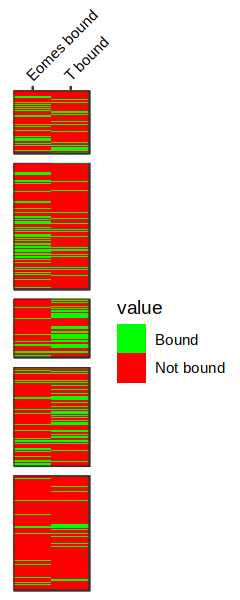

In [139]:
overlap = data.table(region = input_region) %>%
    .[, Eomes_bound := ifelse(.I %in% queryHits(findOverlaps(gr, Eomes_gr, type = 'any', minoverlap = 100)), 'Bound', 'Not bound')] %>%
    .[, T_bound := ifelse(.I %in% queryHits(findOverlaps(gr, T_gr, type = 'any', minoverlap = 100)), 'Bound', 'Not bound')] %>% 
    melt(id.vars = 'region') %>%
    merge(., group.dt, by = 'region') %>% 
    .[,group := factor(group, levels = c(2,3,5,4,1))] %>% 
    .[,region := factor(region, levels = order)] %>%
    .[,variable := gsub('_', ' ', variable)]

options(repr.plot.height=5, repr.plot.width=2)
p3 = ggplot(overlap, aes(variable, region, fill = value)) + 
    geom_tile() + 
    facet_grid(group ~ ., scales = 'free_y', space = 'free_y') + 
   scale_fill_manual(values = c('Bound' = 'green', 'Not bound' = 'red')) + 
    scale_x_discrete(expand = c(0,0), position = 'top') + 
    scale_y_discrete(expand = c(0,0)) + 
    theme_bw() + 
    theme(axis.text = element_text(color = 'black'), 
          axis.text.y = element_blank(),
          axis.title.y = element_blank(),
          axis.title.x = element_blank(),
          axis.text.x = element_text(angle = 45, vjust = 0, hjust = 0),
          axis.ticks.y = element_blank(),
              strip.background = element_blank(),
              strip.text = element_blank())
p3

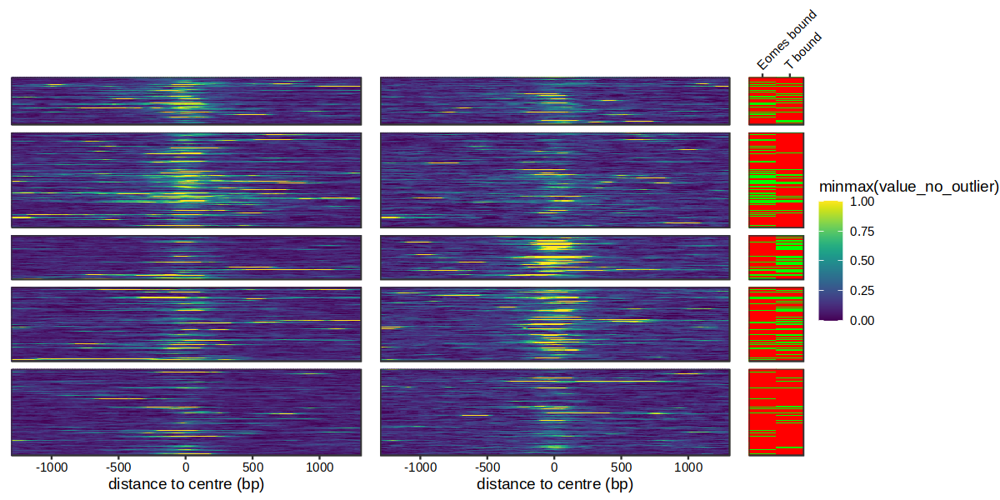

In [36]:
options(repr.plot.height=5, repr.plot.width=10)

ggarrange(p1, p2, p3, nrow = 1, widths = c(1,1,0.2), align = 'hv', common.legend = TRUE, legend = 'right')

In [142]:
args$p2g = file.path(io$basedir, 'results/rna_atac/trajectory/v3')
peak_gene_correlation = fread(file.path(args$p2g, 'acc_gene_correlation.txt.gz'))

In [145]:
condRes = condRes %>% setnames('gene', 'peak') 

In [146]:
condRes_p2g = merge(condRes, peak_gene_correlation, by = 'peak')

In [147]:
group.dt = fread(file.path(args$outdir, 'atac_groups.txt.gz'))

In [148]:
condRes_p2g$group = group.dt[match(condRes_p2g$peak, region), group]

In [149]:
condRes_RNA = fread(file.path(args$outdir, 'condRes_RNA_v2.txt.gz'))

In [150]:
overlap = data.table(region = input_region) %>%
    .[, Eomes_bound := ifelse(.I %in% queryHits(findOverlaps(gr, Eomes_gr, type = 'any', minoverlap = 100)), 'Bound', 'Not bound')] %>%
    .[, T_bound := ifelse(.I %in% queryHits(findOverlaps(gr, T_gr, type = 'any', minoverlap = 100)), 'Bound', 'Not bound')]

condRes_p2g = merge(condRes_p2g, overlap %>% setnames('region', 'peak'), by = 'peak')

In [151]:
tmp = condRes_p2g[abs(cor) > 0.5][gene %in% condRes_RNA[sig == T, gene]] %>% 
    .[T_bound == 'Bound'] %>% 
    .[order(-waldStat)] #%>% 
#    unique(by = 'gene') 
head(tmp)

peak,waldStat,df,pvalue,padj.x,sig,cor,pval,distance,gene,padj.y,group,Eomes_bound,T_bound
<chr>,<dbl>,<int>,<dbl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<int>,<chr>,<chr>
chr2:36234729-36235329,80.16676,8,4.529710e-14,7.535869e-11,TRUE,0.924,8.497187e-10,0,Ptgs1,9.725809e-07,5,Not bound,Bound
chr7:79797030-79797630,79.92055,8,5.073719e-14,8.128286e-11,TRUE,0.708,2.277027e-04,3740,Mesp1,4.771836e-03,4,Bound,Bound
chr7:79797030-79797630,79.92055,8,5.073719e-14,8.128286e-11,TRUE,0.804,6.470290e-06,24473,Anpep,4.191722e-04,4,Bound,Bound
chr8:105937885-105938485,64.25955,5,1.596057e-12,1.569032e-09,TRUE,0.587,4.063687e-03,0,Psmb10,3.344040e-02,5,Bound,Bound
chr11:48871229-48871829,61.75176,2,3.896883e-14,6.742387e-11,TRUE,0.724,1.413235e-04,183,Irgm1,3.446493e-03,2,Not bound,Bound
chr5:115231974-115232574,56.14249,8,2.646227e-09,6.654798e-07,TRUE,0.780,1.883889e-05,37893,Cabp1,8.705260e-04,5,Not bound,Bound


In [152]:
head(overlap)

peak,Eomes_bound,T_bound
<chr>,<chr>,<chr>
chr9:46913091-46913691,Not bound,Not bound
chr1:180888483-180889083,Not bound,Bound
chr14:63359208-63359808,Not bound,Not bound
chr14:121779637-121780237,Bound,Not bound
chr14:23902737-23903337,Bound,Bound
chr16:11469982-11470582,Not bound,Bound


In [153]:
overlap = overlap %>%
    .[, group := ifelse(Eomes_bound == 'Bound' & T_bound == 'Not bound', 'Eo' ,
                        ifelse( Eomes_bound == 'Not bound' & T_bound == 'Bound', 'T' ,
                               ifelse(Eomes_bound == 'Bound' & T_bound == 'Bound', 'Eo-T',
                                      'neither')))]

In [154]:
head(overlap)

peak,Eomes_bound,T_bound,group
<chr>,<chr>,<chr>,<chr>
chr9:46913091-46913691,Not bound,Not bound,neither
chr1:180888483-180889083,Not bound,Bound,T
chr14:63359208-63359808,Not bound,Not bound,neither
chr14:121779637-121780237,Bound,Not bound,Eo
chr14:23902737-23903337,Bound,Bound,Eo-T
chr16:11469982-11470582,Not bound,Bound,T


In [106]:
# write bed & perform HOMER
dir.create(sprintf('%s/homer/', args$outdir), recursive=TRUE, showWarnings =FALSE)
mclapply(unique(overlap$group), function(x){
    tmp = overlap[group == x]%>% 
        .[, chr:=str_split(peak, ':') %>% map_chr(1)] %>%
            .[, start:=as.numeric(str_split(str_split(peak, ':') %>% map_chr(2), '-') %>% map_chr(1))] %>%
            .[, end:=as.numeric(str_split(str_split(peak, ':') %>% map_chr(2), '-') %>% map_chr(2))] %>%
        .[,c('chr', 'start', 'end')]

    fwrite(tmp, sprintf('%s/homer/%s.bed', args$outdir, x) , col.names=F, sep='\t')
})

[[1]]
NULL

[[2]]
NULL

[[3]]
NULL

[[4]]
NULL

In [109]:
# Motif search using Homer
mclapply(unique(overlap$group), function(x){
    cmd = sprintf('/rds/project/rds-SDzz0CATGms/users/bt392/software/homer/bin/findMotifsGenome.pl %s/homer/%s.bed mm10 %s/homer/%s/ -size 250 -S 10 -len 8,10,12 -p 24', 
                       args$outdir, x,
                         args$outdir, x)
    system(cmd)
},mc.cores=4)

[[1]]
[1] 0

[[2]]
[1] 0

[[3]]
[1] 0

[[4]]
[1] 0

In [120]:
# matches <- getMatches(ArchRProject, 'Motif_cisbp')
# rownames(matches) = rownames(atac.sce)

io$multiome = '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/multiome_atlas/'
silico_chip = readRDS(file.path(io$multiome, 'vitro_peaks_silicoChIP_cisbp.rds'))
assay(silico_chip, 'matches') = assay(silico_chip, 'VirtualChipScores') > 0.2 # keep only motifs with in silico score > 0.2
assay(silico_chip, 'motifScores') = NULL
assay(silico_chip, 'motifMatches') = NULL
assay(silico_chip, 'motifCounts') = NULL
assay(silico_chip, 'VirtualChipScores') = NULL
matches = silico_chip


Warning message:
“ggrepel: 1 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


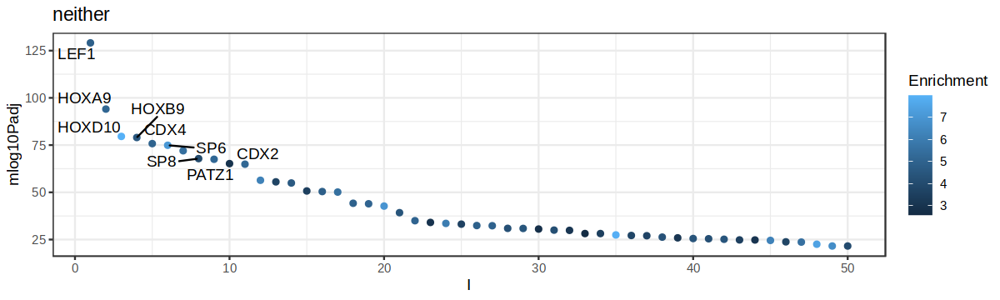

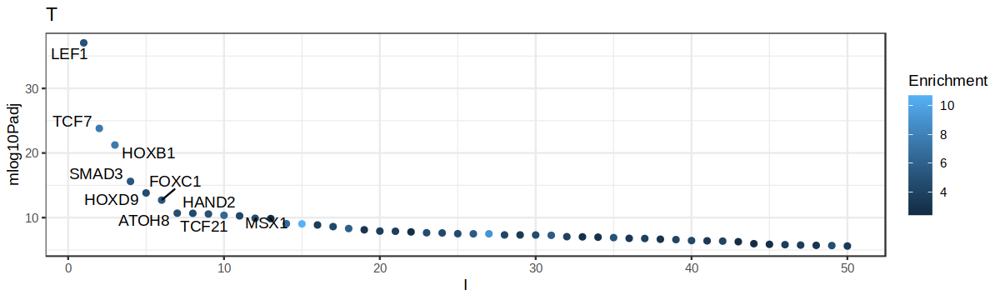

[[1]]

[[2]]

[[3]]

[[4]]


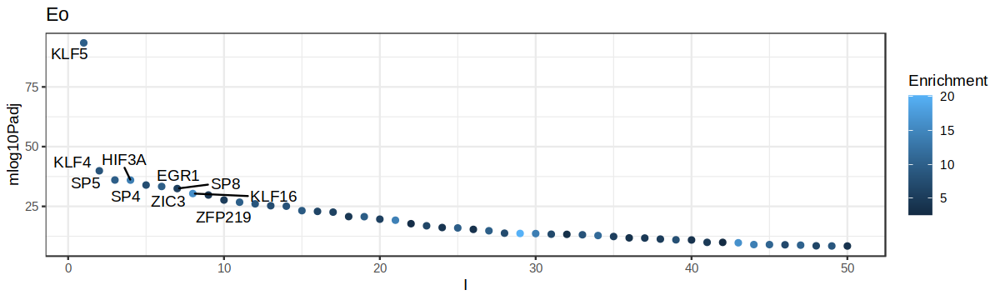

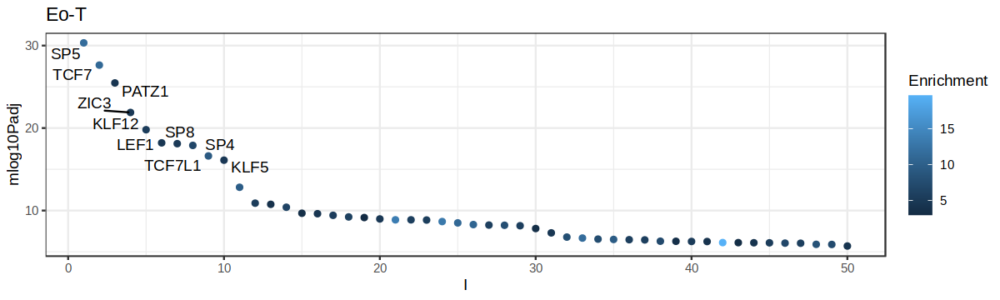

In [121]:
options(repr.plot.width = 10, repr.plot.height = 3)

lapply(unique(overlap$group), function(x){
    peak = overlap[group == x, peak]
    tmp2 = as.data.table(ArchR:::.computeEnrichment(matches, peak, seq_len(nrow(matches)))) %>%
            .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
            .[mlog10Padj > -log10(0.05)]

    to.plot = tmp2[order(-mlog10Padj)] %>% .[,I := .I]
    ggplot(head(to.plot, 50), aes(I, mlog10Padj, color = Enrichment)) + 
        geom_point() + 
        ggrepel::geom_text_repel(data = head(to.plot,10), aes(label = feature), color = 'black') + 
        ggtitle(x) + 
        theme_bw()
})


`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.



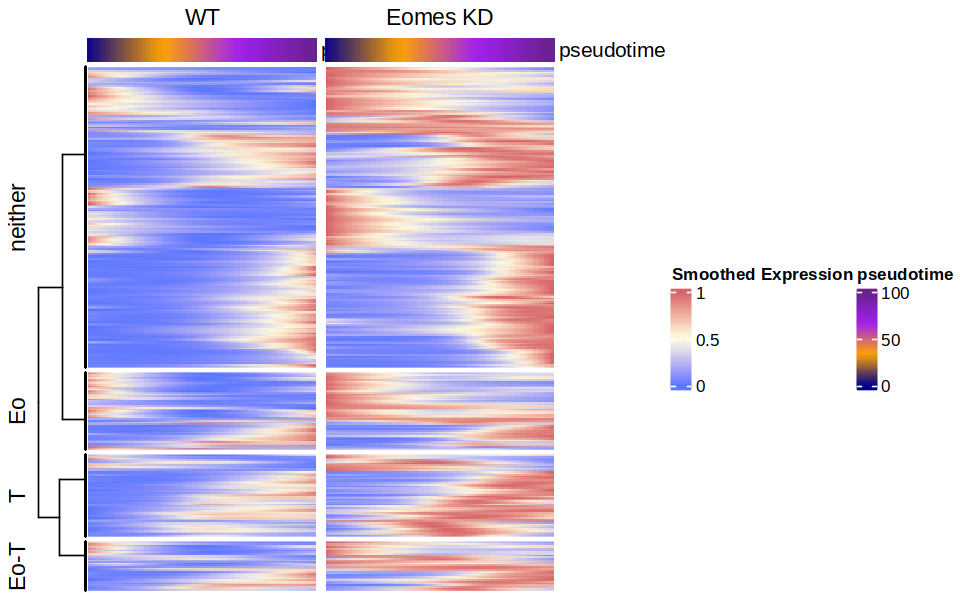

In [156]:
# Clustering
set.seed(42)
k = 5
group = overlap$group
names(group) = overlap$peak
row_clust = cluster_within_group(t(yhatSmooth_minmax), group)

ra = rowAnnotation(foo = anno_mark(at = match(genes_label, rownames(WT)), labels = genes_label))


hm_list = Heatmap(WT, 
                  cluster_rows = row_clust,
                  cluster_columns = FALSE,
                  column_title = 'WT',
                  show_column_names  = FALSE,
                  row_split = k,
                  #row_split = as.data.frame(group), 
                  #km = 6,
                  col = cols,
                  heatmap_legend_param = list(title = 'Smoothed Expression'), 
                  top_annotation = ha) + 
          Heatmap(KO, 
                  cluster_columns = FALSE, 
                  column_title = 'Eomes KD',
                  show_column_names  = FALSE,
                  show_row_names  = FALSE,
                  col = cols,
                  show_heatmap_legend = F, 
                  top_annotation = ha,
                  right_annotation = ra)

options(repr.plot.height=5, repr.plot.width=8)
draw(hm_list)